<a href="https://colab.research.google.com/github/ivanf2110/MBA/blob/main/TCC_Ivan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TCC — Metodologia de Previsão de Séries Temporais no Varejo
## Da Estatística ao Aprendizado Profundo

**Autor:** Ivan Flavio Aparecido Bernardino  
**Curso:** MBA em Ciência de Dados — ICMC/USP

In [2]:
!pip install numpy pandas matplotlib seaborn plotly statsmodels xgboost tensorflow prophet

   ---------------------------------------- 0.0/9.8 MB ? eta -:--:--
   -- ------------------------------------- 0.5/9.8 MB 4.2 MB/s eta 0:00:03
   ----- ---------------------------------- 1.3/9.8 MB 4.2 MB/s eta 0:00:03
   --------- ------------------------------ 2.4/9.8 MB 4.3 MB/s eta 0:00:02
   -------------- ------------------------- 3.7/9.8 MB 4.7 MB/s eta 0:00:02
   ------------------- -------------------- 4.7/9.8 MB 5.0 MB/s eta 0:00:02
   ------------------------ --------------- 6.0/9.8 MB 5.1 MB/s eta 0:00:01
   ----------------------------- ---------- 7.3/9.8 MB 5.4 MB/s eta 0:00:01
   ------------------------------ --------- 7.6/9.8 MB 5.4 MB/s eta 0:00:01
   ------------------------------ --------- 7.6/9.8 MB 5.4 MB/s eta 0:00:01
   ----------------------------------- ---- 8.7/9.8 MB 4.3 MB/s eta 0:00:01
   ---------------------------------------- 9.8/9.8 MB 4.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/9.6 MB ? eta -:--:--
   -------- --------------

ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'C:\\Users\\ivanf\\AppData\\Local\\Packages\\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\\LocalCache\\local-packages\\Python311\\site-packages\\prophet\\stan_model\\cmdstan-2.37.0\\stan\\lib\\stan_math\\lib\\tbb_2020.3\\include\\tbb\\internal\\_deprecated_header_message_guard.h'
HINT: This error might have occurred since this system does not have Windows Long Path support enabled. You can find information on how to enable this at https://pip.pypa.io/warnings/enable-long-paths


[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: C:\Users\ivanf\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [5]:
!pip install --upgrade pip

   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 1.8/1.8 MB 32.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 25.0.1
    Uninstalling pip-25.0.1:
      Successfully uninstalled pip-25.0.1


In [7]:
!pip install tensorflow==2.13.0

INFO: pip is looking at multiple versions of grpcio to determine which version is compatible with other requirements. This could take a while.
   ---------------------------------------- 0.0/276.6 MB ? eta -:--:--
   ---------------------------------------- 2.4/276.6 MB 14.9 MB/s eta 0:00:19
    --------------------------------------- 5.5/276.6 MB 14.6 MB/s eta 0:00:19
   - -------------------------------------- 7.3/276.6 MB 13.3 MB/s eta 0:00:21
   - -------------------------------------- 8.7/276.6 MB 11.0 MB/s eta 0:00:25
   - -------------------------------------- 9.4/276.6 MB 10.0 MB/s eta 0:00:27
   - -------------------------------------- 10.2/276.6 MB 8.7 MB/s eta 0:00:31
   - -------------------------------------- 10.5/276.6 MB 8.3 MB/s eta 0:00:33
   - -------------------------------------- 10.7/276.6 MB 7.5 MB/s eta 0:00:36
   - -------------------------------------- 11.0/276.6 MB 6.5 MB/s eta 0:00:41
   - -------------------------------------- 11.3/276.6 MB 5.6 MB/s eta 0:00

  You can safely remove it manually.
  You can safely remove it manually.
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'C:\\Users\\ivanf\\AppData\\Local\\Packages\\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\\LocalCache\\local-packages\\Python311\\site-packages\\tensorflow\\include\\external\\com_github_grpc_grpc\\src\\core\\ext\\filters\\client_channel\\lb_policy\\grpclb\\client_load_reporting_filter.h'
HINT: This error might have occurred since this system does not have Windows Long Path support enabled. You can find information on how to enable this at https://pip.pypa.io/warnings/enable-long-paths



In [8]:
# ====================================================
# 1. IMPORTAÇÃO DE PACOTES
# ====================================================
import sys, os, warnings, importlib, platform, json
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
import os
import zipfile
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)

def is_available(pkg):
    try:
        return importlib.util.find_spec(pkg) is not None
    except Exception:
        return False

HAVE_XGB = is_available('xgboost')
HAVE_TF = is_available('tensorflow')
HAVE_PROPHET = is_available('prophet') or is_available('fbprophet')

print('Python:', platform.python_version())
print('NumPy:', np.__version__)
print('Pandas:', pd.__version__)
print('Matplotlib:', plt.matplotlib.__version__)
try:
    import statsmodels
    print('statsmodels:', statsmodels.__version__)
except Exception as e:
    print('statsmodels indisponível:', e)
print('xgboost disponível?', HAVE_XGB)
print('tensorflow disponível?', HAVE_TF)
print('prophet disponível?', HAVE_PROPHET)


plt.rcParams["figure.figsize"] = (32, 6)
plt.rcParams["axes.grid"] = True


import seaborn as sns
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
pd.plotting.register_matplotlib_converters()
%matplotlib inline


import plotly.graph_objects as go
from plotly.subplots import make_subplots

Python: 3.11.9
NumPy: 2.2.4
Pandas: 2.2.3
Matplotlib: 3.10.1
statsmodels: 0.14.5
xgboost disponível? True
tensorflow disponível? True
prophet disponível? True


## 2. Ingestão dos Dados (Kaggle)

In [9]:
from google.colab import files
files.upload()  # Escolha o arquivo kaggle.json

ModuleNotFoundError: No module named 'google.colab'

In [6]:
# Crie a pasta .kaggle e mova o arquivo para lá
os.makedirs("/root/.kaggle", exist_ok=True)
!mv kaggle.json /root/.kaggle/kaggle.json

# Dê permissão ao arquivo
!chmod 600 /root/.kaggle/kaggle.json

mv: cannot stat 'kaggle.json': No such file or directory


In [7]:
!kaggle competitions download -c m5-forecasting-accuracy

m5-forecasting-accuracy.zip: Skipping, found more recently modified local copy (use --force to force download)


In [8]:
# Extraia o conteúdo do zip
with zipfile.ZipFile("m5-forecasting-accuracy.zip", "r") as zip_ref:
    zip_ref.extractall("walmart_dataset")

# Verifique os arquivos

print("Arquivos extraídos:", os.listdir("walmart_dataset"))

Arquivos extraídos: ['sales_train_validation.csv', 'sample_submission.csv', 'sales_train_evaluation.csv', 'sell_prices.csv', 'calendar.csv']


In [9]:
df = pd.read_csv("walmart_dataset/sales_train_validation.csv")
df.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [10]:
print(pd.read_csv("walmart_dataset/calendar.csv"))


            date  wm_yr_wk    weekday  wday  month  year       d  \
0     2011-01-29     11101   Saturday     1      1  2011     d_1   
1     2011-01-30     11101     Sunday     2      1  2011     d_2   
2     2011-01-31     11101     Monday     3      1  2011     d_3   
3     2011-02-01     11101    Tuesday     4      2  2011     d_4   
4     2011-02-02     11101  Wednesday     5      2  2011     d_5   
...          ...       ...        ...   ...    ...   ...     ...   
1964  2016-06-15     11620  Wednesday     5      6  2016  d_1965   
1965  2016-06-16     11620   Thursday     6      6  2016  d_1966   
1966  2016-06-17     11620     Friday     7      6  2016  d_1967   
1967  2016-06-18     11621   Saturday     1      6  2016  d_1968   
1968  2016-06-19     11621     Sunday     2      6  2016  d_1969   

      event_name_1 event_type_1  event_name_2 event_type_2  snap_CA  snap_TX  \
0              NaN          NaN           NaN          NaN        0        0   
1              NaN     

Visão Geral dos Dados

O conjunto de dados M5 Forecasting – Accuracy, disponibilizado pelo Walmart no Kaggle, é composto por cinco arquivos CSV.
Ele contém informações de vendas diárias de produtos, preços e eventos especiais, com o objetivo de prever a demanda futura.

Arquivo 1: calendar.csv

Contém as datas em que os produtos foram vendidos, além de informações sobre eventos e feriados.

Colunas:

date: Data no formato “YYYY-MM-DD”.

wm_yr_wk: Identificador da semana correspondente à data.

weekday / wday: Dia da semana (sábado, domingo, …, sexta) e seu identificador numérico.

month / year: Mês e ano da data.

event_name_1 / event_type_1: Nome e tipo do primeiro evento (se houver).

event_name_2 / event_type_2: Nome e tipo do segundo evento (se houver).

snap_CA, snap_TX, snap_WI: Variáveis binárias (0 ou 1) que indicam se as lojas da Califórnia (CA), Texas (TX) ou Wisconsin (WI) permitem compras via programa SNAP na respectiva data.

Arquivo 2: sales_train_validation.csv

Contém o histórico diário de vendas (em unidades) por produto e loja, do dia d_1 ao d_1913.

Colunas:

item_id: Identificador do produto.

dept_id: Identificador do departamento ao qual o produto pertence.

cat_id: Identificador da categoria do produto.

store_id: Identificador da loja onde o produto foi vendido.

state_id: Identificador do estado onde a loja está localizada.

d_1 … d_1941: Quantidade de unidades vendidas em cada dia.

Arquivo 3: sell_prices.csv

Contém informações sobre os preços dos produtos, por loja e por semana.

Colunas:

store_id: Identificador da loja.

item_id: Identificador do produto.

wm_yr_wk: Identificador semanal (correspondente ao arquivo calendar.csv).

sell_price: Preço médio do produto naquela semana e loja.

Arquivo 5: sales_train_evaluation.csv

Semelhante ao arquivo de validação, porém com dados de vendas estendidos até o dia d_1941.
É utilizado para prever as vendas do período d_1942–d_1969.

Divisão dos conjuntos:

Treinamento: d_1 – d_1913

Validação: d_1914 – d_1941

Avaliação: d_1942 – d_1969

## 1.0 Análise exploratória e Tratamentos

In [11]:
# Funções uteis

def analisar_dataframe(df):
    resultado = {}

    for coluna in df.columns:
        info_coluna = {}
        tipo = df[coluna].dtype

        # Verifica valores nulos
        nulos = df[coluna].isnull().sum()
        if nulos > 0:
            info_coluna['nulos'] = nulos

        # Coluna categórica ou string
        if tipo == 'object' or pd.api.types.is_categorical_dtype(df[coluna]):
            info_coluna['tipo'] = 'categórica'
            categorias = df[coluna].dropna().unique().tolist()
            contagem = df[coluna].value_counts(dropna=True).to_dict()
            info_coluna['categorias_distintas'] = categorias
            info_coluna['contagem_por_categoria'] = contagem

        # Coluna numérica
        elif pd.api.types.is_numeric_dtype(df[coluna]):
            info_coluna['tipo'] = 'numérica'
            info_coluna['mínimo'] = df[coluna].min()
            info_coluna['máximo'] = df[coluna].max()
            info_coluna['mediana'] = df[coluna].median()
            info_coluna['moda'] = df[coluna].mode().tolist()

        else:
            info_coluna['tipo'] = str(tipo)

        resultado[coluna] = info_coluna

    return resultado

## 1.1 DF Calendário

In [12]:
calendar_df = pd.read_csv('walmart_dataset/calendar.csv')
calendar_df.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [13]:
calendar_df.tail()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0
1968,2016-06-19,11621,Sunday,2,6,2016,d_1969,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0


In [14]:
calendar_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969 entries, 0 to 1968
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          1969 non-null   object
 1   wm_yr_wk      1969 non-null   int64 
 2   weekday       1969 non-null   object
 3   wday          1969 non-null   int64 
 4   month         1969 non-null   int64 
 5   year          1969 non-null   int64 
 6   d             1969 non-null   object
 7   event_name_1  162 non-null    object
 8   event_type_1  162 non-null    object
 9   event_name_2  5 non-null      object
 10  event_type_2  5 non-null      object
 11  snap_CA       1969 non-null   int64 
 12  snap_TX       1969 non-null   int64 
 13  snap_WI       1969 non-null   int64 
dtypes: int64(7), object(7)
memory usage: 215.5+ KB


In [15]:
calendar_df.shape

(1969, 14)

In [16]:
calendar_df.isnull().sum()

,0
date,0
wm_yr_wk,0
weekday,0
wday,0
month,0
year,0
d,0
event_name_1,1807
event_type_1,1807
event_name_2,1964


In [17]:
analise = analisar_dataframe(calendar_df)
for coluna, info in analise.items():
    print(f"\n📊 Coluna: {coluna}")
    for chave, valor in info.items():
        print(f"  - {chave}: {valor}")



📊 Coluna: date
  - tipo: categórica
  - categorias_distintas: ['2011-01-29', '2011-01-30', '2011-01-31', '2011-02-01', '2011-02-02', '2011-02-03', '2011-02-04', '2011-02-05', '2011-02-06', '2011-02-07', '2011-02-08', '2011-02-09', '2011-02-10', '2011-02-11', '2011-02-12', '2011-02-13', '2011-02-14', '2011-02-15', '2011-02-16', '2011-02-17', '2011-02-18', '2011-02-19', '2011-02-20', '2011-02-21', '2011-02-22', '2011-02-23', '2011-02-24', '2011-02-25', '2011-02-26', '2011-02-27', '2011-02-28', '2011-03-01', '2011-03-02', '2011-03-03', '2011-03-04', '2011-03-05', '2011-03-06', '2011-03-07', '2011-03-08', '2011-03-09', '2011-03-10', '2011-03-11', '2011-03-12', '2011-03-13', '2011-03-14', '2011-03-15', '2011-03-16', '2011-03-17', '2011-03-18', '2011-03-19', '2011-03-20', '2011-03-21', '2011-03-22', '2011-03-23', '2011-03-24', '2011-03-25', '2011-03-26', '2011-03-27', '2011-03-28', '2011-03-29', '2011-03-30', '2011-03-31', '2011-04-01', '2011-04-02', '2011-04-03', '2011-04-04', '2011-04-05'

## 1.2 DF Sell Price

In [18]:
selling_prices_df = pd.read_csv('walmart_dataset/sell_prices.csv')
selling_prices_df.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


In [19]:
selling_prices_df.tail()

,store_id,item_id,wm_yr_wk,sell_price
6841116,WI_3,FOODS_3_827,11617,1.0
6841117,WI_3,FOODS_3_827,11618,1.0
6841118,WI_3,FOODS_3_827,11619,1.0
6841119,WI_3,FOODS_3_827,11620,1.0
6841120,WI_3,FOODS_3_827,11621,1.0


In [20]:
selling_prices_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6841121 entries, 0 to 6841120
Data columns (total 4 columns):
 #   Column      Dtype  
---  ------      -----  
 0   store_id    object 
 1   item_id     object 
 2   wm_yr_wk    int64  
 3   sell_price  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 208.8+ MB


In [21]:
analise = analisar_dataframe(selling_prices_df)
for coluna, info in analise.items():
    print(f"\n📊 Coluna: {coluna}")
    for chave, valor in info.items():
        print(f"  - {chave}: {valor}")


📊 Coluna: store_id
  - tipo: categórica
  - categorias_distintas: ['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1', 'WI_2', 'WI_3']
  - contagem_por_categoria: {'TX_2': 701214, 'TX_1': 699796, 'CA_1': 698412, 'WI_3': 696094, 'CA_3': 693990, 'TX_3': 691112, 'CA_4': 679025, 'WI_2': 678171, 'WI_1': 665912, 'CA_2': 637395}

📊 Coluna: item_id
  - tipo: categórica
  - categorias_distintas: ['HOBBIES_1_001', 'HOBBIES_1_002', 'HOBBIES_1_003', 'HOBBIES_1_004', 'HOBBIES_1_005', 'HOBBIES_1_006', 'HOBBIES_1_007', 'HOBBIES_1_008', 'HOBBIES_1_009', 'HOBBIES_1_010', 'HOBBIES_1_011', 'HOBBIES_1_012', 'HOBBIES_1_013', 'HOBBIES_1_014', 'HOBBIES_1_015', 'HOBBIES_1_016', 'HOBBIES_1_017', 'HOBBIES_1_018', 'HOBBIES_1_019', 'HOBBIES_1_020', 'HOBBIES_1_021', 'HOBBIES_1_022', 'HOBBIES_1_023', 'HOBBIES_1_024', 'HOBBIES_1_025', 'HOBBIES_1_026', 'HOBBIES_1_027', 'HOBBIES_1_028', 'HOBBIES_1_029', 'HOBBIES_1_030', 'HOBBIES_1_031', 'HOBBIES_1_032', 'HOBBIES_1_033', 'HOBBIES_1_034', 'HOBBIES_1_035', '

In [22]:
selling_prices_df.isnull().sum()

,0
store_id,0
item_id,0
wm_yr_wk,0
sell_price,0


## 1.3 DF Sales

In [23]:
sales_train_valid_df = pd.read_csv('walmart_dataset/sales_train_validation.csv')
sales_train_valid_df.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [24]:
sales_train_valid_df.tail()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3
30489,FOODS_3_827_WI_3_validation,FOODS_3_827,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
sales_train_valid_df.dtypes

,0
id,object
item_id,object
dept_id,object
cat_id,object
store_id,object
...,...
d_1909,int64
d_1910,int64
d_1911,int64
d_1912,int64


In [26]:
analise = analisar_dataframe(sales_train_valid_df)
for coluna, info in analise.items():
    if coluna.startswith('d_'):
        continue  # pula colunas que começam com 'd_'

    print(f"\n📊 Coluna: {coluna}")
    for chave, valor in info.items():
        print(f"  - {chave}: {valor}")



📊 Coluna: id
  - tipo: categórica
  - categorias_distintas: ['HOBBIES_1_001_CA_1_validation', 'HOBBIES_1_002_CA_1_validation', 'HOBBIES_1_003_CA_1_validation', 'HOBBIES_1_004_CA_1_validation', 'HOBBIES_1_005_CA_1_validation', 'HOBBIES_1_006_CA_1_validation', 'HOBBIES_1_007_CA_1_validation', 'HOBBIES_1_008_CA_1_validation', 'HOBBIES_1_009_CA_1_validation', 'HOBBIES_1_010_CA_1_validation', 'HOBBIES_1_011_CA_1_validation', 'HOBBIES_1_012_CA_1_validation', 'HOBBIES_1_013_CA_1_validation', 'HOBBIES_1_014_CA_1_validation', 'HOBBIES_1_015_CA_1_validation', 'HOBBIES_1_016_CA_1_validation', 'HOBBIES_1_017_CA_1_validation', 'HOBBIES_1_018_CA_1_validation', 'HOBBIES_1_019_CA_1_validation', 'HOBBIES_1_020_CA_1_validation', 'HOBBIES_1_021_CA_1_validation', 'HOBBIES_1_022_CA_1_validation', 'HOBBIES_1_023_CA_1_validation', 'HOBBIES_1_024_CA_1_validation', 'HOBBIES_1_025_CA_1_validation', 'HOBBIES_1_026_CA_1_validation', 'HOBBIES_1_027_CA_1_validation', 'HOBBIES_1_028_CA_1_validation', 'HOBBIES_1_029

## 1.4 DF Submission

In [27]:
sample_sub_df = pd.read_csv('walmart_dataset/sample_submission.csv')
sample_sub_df.head()

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
sample_sub_df.tail()

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
60975,FOODS_3_823_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60976,FOODS_3_824_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60977,FOODS_3_825_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60978,FOODS_3_826_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60979,FOODS_3_827_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [29]:
sample_sub_df.dtypes

,0
id,object
F1,int64
F2,int64
F3,int64
F4,int64
F5,int64
F6,int64
F7,int64
F8,int64
F9,int64


In [30]:
analise = analisar_dataframe(sample_sub_df)
for coluna, info in analise.items():
    print(f"\n📊 Coluna: {coluna}")
    for chave, valor in info.items():
        print(f"  - {chave}: {valor}")



📊 Coluna: id
  - tipo: categórica
  - categorias_distintas: ['HOBBIES_1_001_CA_1_validation', 'HOBBIES_1_002_CA_1_validation', 'HOBBIES_1_003_CA_1_validation', 'HOBBIES_1_004_CA_1_validation', 'HOBBIES_1_005_CA_1_validation', 'HOBBIES_1_006_CA_1_validation', 'HOBBIES_1_007_CA_1_validation', 'HOBBIES_1_008_CA_1_validation', 'HOBBIES_1_009_CA_1_validation', 'HOBBIES_1_010_CA_1_validation', 'HOBBIES_1_011_CA_1_validation', 'HOBBIES_1_012_CA_1_validation', 'HOBBIES_1_013_CA_1_validation', 'HOBBIES_1_014_CA_1_validation', 'HOBBIES_1_015_CA_1_validation', 'HOBBIES_1_016_CA_1_validation', 'HOBBIES_1_017_CA_1_validation', 'HOBBIES_1_018_CA_1_validation', 'HOBBIES_1_019_CA_1_validation', 'HOBBIES_1_020_CA_1_validation', 'HOBBIES_1_021_CA_1_validation', 'HOBBIES_1_022_CA_1_validation', 'HOBBIES_1_023_CA_1_validation', 'HOBBIES_1_024_CA_1_validation', 'HOBBIES_1_025_CA_1_validation', 'HOBBIES_1_026_CA_1_validation', 'HOBBIES_1_027_CA_1_validation', 'HOBBIES_1_028_CA_1_validation', 'HOBBIES_1_029

## 2. Entendimento dos dados

In [31]:
date_col = [col for col in sales_train_valid_df if col.startswith('d_')]
print(date_col)

['d_1', 'd_2', 'd_3', 'd_4', 'd_5', 'd_6', 'd_7', 'd_8', 'd_9', 'd_10', 'd_11', 'd_12', 'd_13', 'd_14', 'd_15', 'd_16', 'd_17', 'd_18', 'd_19', 'd_20', 'd_21', 'd_22', 'd_23', 'd_24', 'd_25', 'd_26', 'd_27', 'd_28', 'd_29', 'd_30', 'd_31', 'd_32', 'd_33', 'd_34', 'd_35', 'd_36', 'd_37', 'd_38', 'd_39', 'd_40', 'd_41', 'd_42', 'd_43', 'd_44', 'd_45', 'd_46', 'd_47', 'd_48', 'd_49', 'd_50', 'd_51', 'd_52', 'd_53', 'd_54', 'd_55', 'd_56', 'd_57', 'd_58', 'd_59', 'd_60', 'd_61', 'd_62', 'd_63', 'd_64', 'd_65', 'd_66', 'd_67', 'd_68', 'd_69', 'd_70', 'd_71', 'd_72', 'd_73', 'd_74', 'd_75', 'd_76', 'd_77', 'd_78', 'd_79', 'd_80', 'd_81', 'd_82', 'd_83', 'd_84', 'd_85', 'd_86', 'd_87', 'd_88', 'd_89', 'd_90', 'd_91', 'd_92', 'd_93', 'd_94', 'd_95', 'd_96', 'd_97', 'd_98', 'd_99', 'd_100', 'd_101', 'd_102', 'd_103', 'd_104', 'd_105', 'd_106', 'd_107', 'd_108', 'd_109', 'd_110', 'd_111', 'd_112', 'd_113', 'd_114', 'd_115', 'd_116', 'd_117', 'd_118', 'd_119', 'd_120', 'd_121', 'd_122', 'd_123', 

state_id
CA    12196
TX     9147
WI     9147
Name: count, dtype: int64


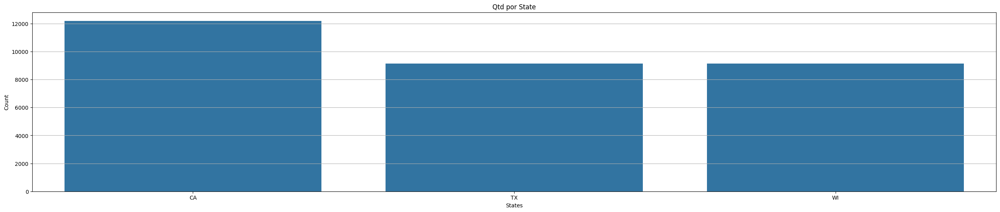

In [32]:
# Contagem por states

sales_state = sales_train_valid_df.state_id.value_counts()
print(sales_state)

# gráfico
sales_state_df = sales_state.reset_index()
sales_state_df.columns = ['state_id', 'count']

# Gráfico de barras
sns.barplot(x='state_id', y='count', data=sales_state_df)
plt.xlabel('States')
plt.ylabel('Count')
plt.title('Qtd por State')
plt.show()


In [33]:
# Participação por state (qtd)
percent_state = sales_train_valid_df.state_id.value_counts()/sales_train_valid_df.shape[0] * 100
print(percent_state)

state_id
CA    40.0
TX    30.0
WI    30.0
Name: count, dtype: float64


In [34]:
# Inclusão do total de vendas e depois total por state
sales_train_valid_df['total_sales'] = sales_train_valid_df[date_col].sum(axis=1)

sales_train_valid_df.groupby('state_id').agg({'total_sales':'sum'}).reset_index()

sales_train_valid_df.groupby('state_id').agg({'total_sales':'sum'})/sales_train_valid_df.total_sales.sum() * 100



,total_sales
state_id,
CA,43.649240
TX,28.767621
WI,27.583139


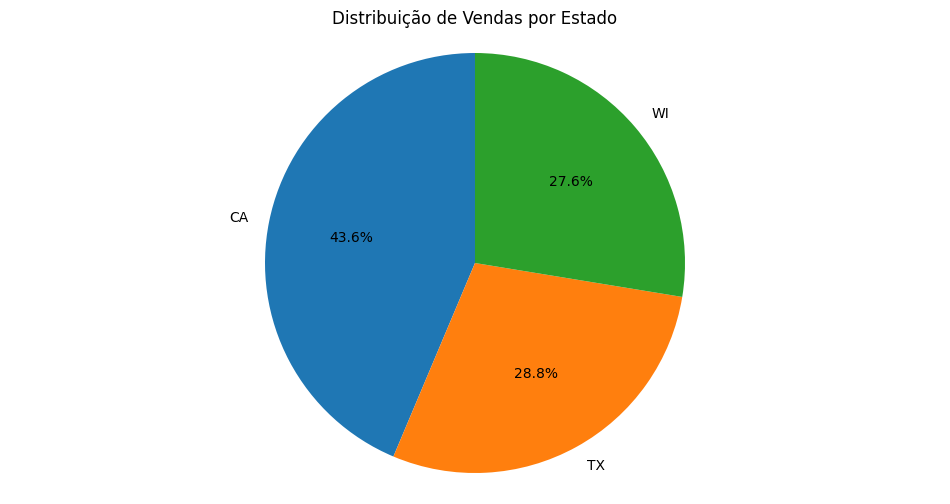

In [35]:
aux = sales_train_valid_df.groupby('state_id').agg({'total_sales':'sum'})/sales_train_valid_df.total_sales.sum() * 100
aux_percent = aux / aux.total_sales.sum() * 100

# Preparar dados para o gráfico
labels = aux_percent.index.tolist()
sizes = aux_percent['total_sales'].tolist()

# Gráfico de pizza
plt.figure(figsize=(12, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribuição de Vendas por Estado')
plt.axis('equal')
plt.show()




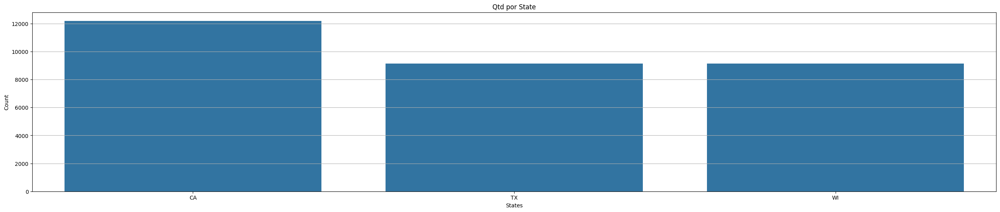

In [36]:
# gráfico em valor
sales_state_df = sales_state.reset_index()
sales_state_df.columns = ['state_id', 'count']

# Gráfico de barras
sns.barplot(x='state_id', y='count', data=sales_state_df)
plt.xlabel('States')
plt.ylabel('Count')
plt.title('Qtd por State')
plt.show()

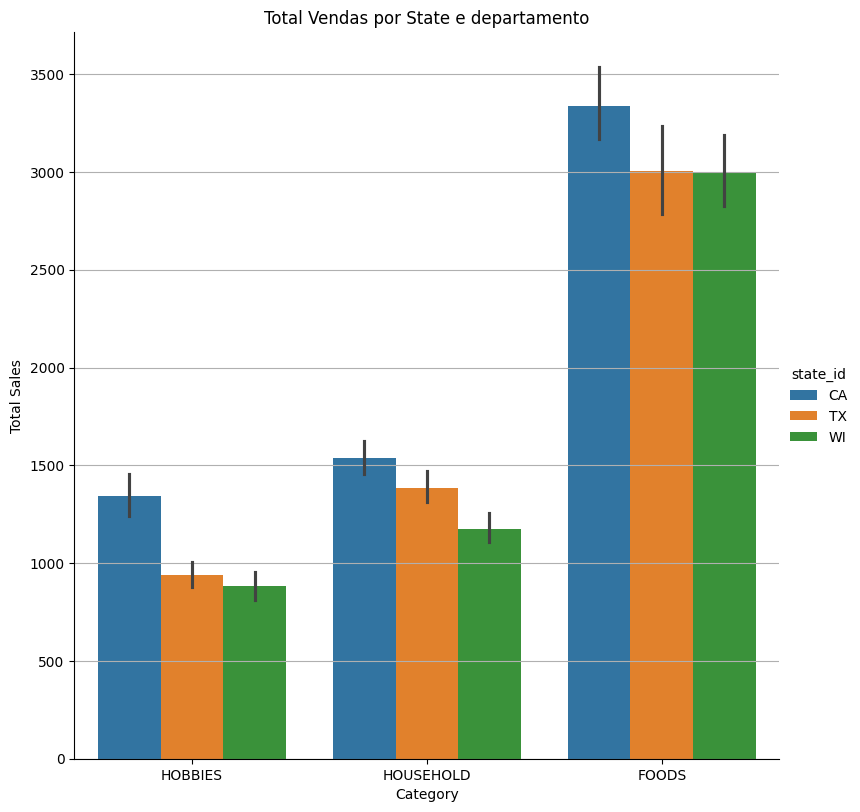

In [37]:
# Seleciona apenas colunas de vendas (que começam com 'd_')
vendas_cols = [col for col in sales_train_valid_df.columns if col.startswith('d_')]

# Soma apenas essas colunas
sales_train_valid_df['total_sales'] = sales_train_valid_df[vendas_cols].sum(axis=1)

# gráfico
sns.catplot(x='cat_id', y='total_sales',
            hue='state_id',
            data=sales_train_valid_df, kind='bar',
            height=8, aspect=1)

plt.title('Total Vendas por State e departamento')
plt.xlabel('Category')
plt.ylabel('Total Sales')
plt.show()


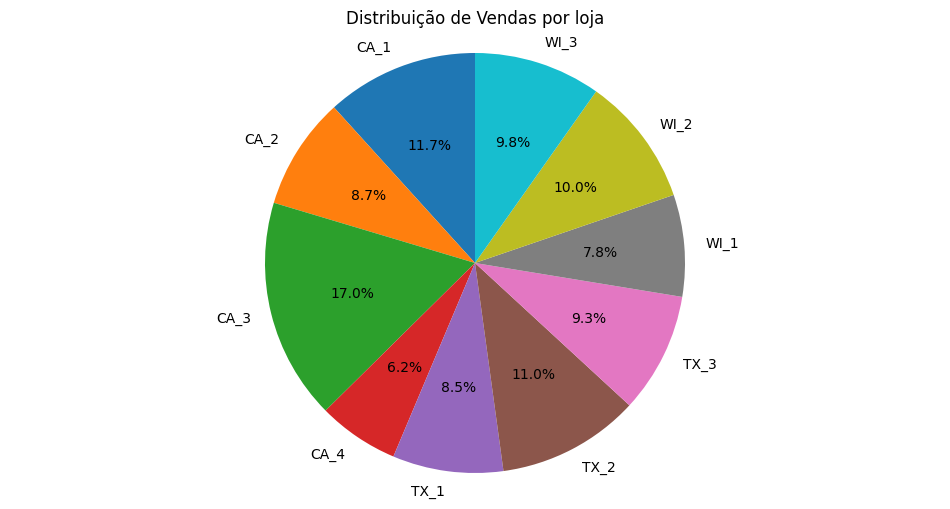

In [38]:
aux = sales_train_valid_df.groupby('store_id').agg({'total_sales':'sum'})/sales_train_valid_df.total_sales.sum() * 100
aux_percent = aux / aux.total_sales.sum() * 100

# Preparar dados para o gráfico
labels = aux_percent.index.tolist()
sizes = aux_percent['total_sales'].tolist()

# Gráfico de pizza
plt.figure(figsize=(12, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribuição de Vendas por loja')
plt.axis('equal')
plt.show()




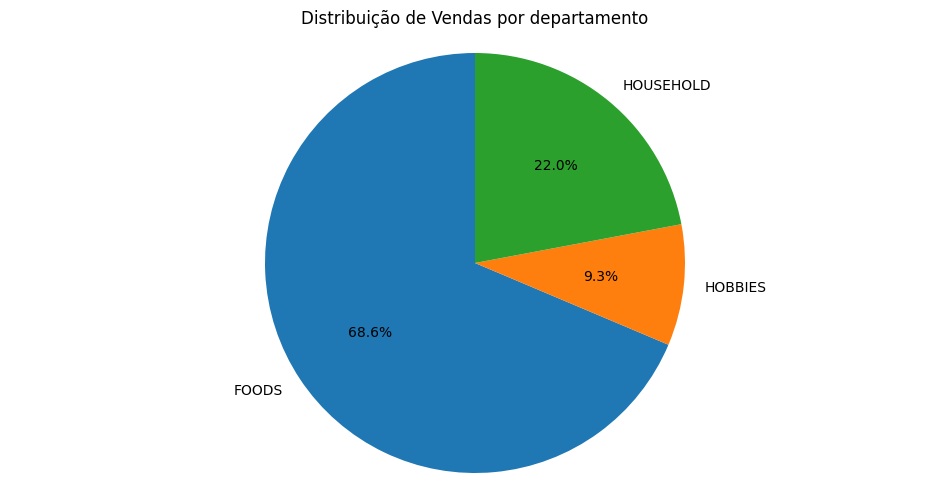

In [39]:
aux = sales_train_valid_df.groupby('cat_id').agg({'total_sales':'sum'})/sales_train_valid_df.total_sales.sum() * 100
aux_percent = aux / aux.total_sales.sum() * 100

# Preparar dados para o gráfico
labels = aux_percent.index.tolist()
sizes = aux_percent['total_sales'].tolist()

# Gráfico de pizza
plt.figure(figsize=(12, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribuição de Vendas por departamento')
plt.axis('equal')
plt.show()




In [46]:
# Série de vendas por states


# Colunas de demanda
d_cols = [c for c in sales_train_valid_df.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
state_series = sales_train_valid_df.groupby('state_id')[d_cols].sum()

# Lista de estados
ids = state_series.index.tolist()
n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Estado: {state}" for state in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, state in enumerate(ids):
    x = np.arange(len(d_cols))
    y = state_series.loc[state].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda agregada por estado ao longo do tempo")
fig.show()

In [58]:
# departamento por state CA

# Colunas de demanda
d_cols = [c for c in sales_train_valid_df.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = sales_train_valid_df[sales_train_valid_df['state_id'] == 'CA']
aux = aux.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda agregada por departamento em CA ao longo do tempo")
fig.show()


In [59]:
# departamento por state TX

# Colunas de demanda
d_cols = [c for c in sales_train_valid_df.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = sales_train_valid_df[sales_train_valid_df['state_id'] == 'TX']
aux = aux.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda agregada por departamento em TX ao longo do tempo")
fig.show()


In [60]:
# departamento por state WI

# Colunas de demanda
d_cols = [c for c in sales_train_valid_df.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = sales_train_valid_df[sales_train_valid_df['state_id'] == 'WI']
aux = aux.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda agregada por departamento em WI ao longo do tempo")
fig.show()


In [56]:
# MAIORES PRODUTOS DE CADA CATEGORIA

# IDs únicos top 3 de cada departamento
aux = sales_train_valid_df.groupby(['cat_id', 'item_id']).agg({'total_sales': 'sum'}).reset_index()

# Aplica rank por dept_id e filtra os top 3
aux = aux.groupby('cat_id').apply(lambda x: x.nlargest(3, 'total_sales')).reset_index(drop=True)
aux = aux.sort_values(by=['cat_id', 'total_sales'], ascending=[True, False])
print(aux)

ids = aux['item_id'].tolist()


# Lista de item_ids únicos
ids = list(set(aux['item_id']))
d_cols = [c for c in sales_train_valid_df.columns if 'd_' in c]

# Número de itens a plotar
n = len(ids)

# Cria subplots dinâmicos
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Produto: {item}" for item in ids])

# Adiciona os gráficos
for i, item_id in enumerate(ids):
    x = sales_train_valid_df.loc[sales_train_valid_df['item_id'] == item_id].set_index('item_id')[d_cols].values[0]
    cor = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
    fig.add_trace(go.Scatter(x=np.arange(len(x)), y=x, showlegend=False,
                             mode='lines', marker=dict(color=cor[i % len(cor)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda ao longo do tempo por item_id")
fig.show()


      cat_id          item_id  total_sales
0      FOODS      FOODS_3_090      1002529
1      FOODS      FOODS_3_586       920242
2      FOODS      FOODS_3_252       565299
3    HOBBIES    HOBBIES_1_371       122565
4    HOBBIES    HOBBIES_1_348       105876
5    HOBBIES    HOBBIES_1_268        95171
6  HOUSEHOLD  HOUSEHOLD_1_334       171275
7  HOUSEHOLD  HOUSEHOLD_1_459       170532
8  HOUSEHOLD  HOUSEHOLD_1_521       153340


In [57]:
# departamento por state CA

# Colunas de demanda
d_cols = [c for c in sales_train_valid_df.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = sales_train_valid_df[sales_train_valid_df['state_id'] == 'CA']
aux = aux.groupby('store_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda agregada por LOJA EM em CA ao longo do tempo")
fig.show()


##3.0 EDA Do estado da California

In [62]:
df_ca = sales_train_valid_df.copy()
df_ca = df_ca[df_ca['state_id'] == 'CA']
# df_ca = df_ca[df_ca['store_id'] == 'CA_1']
df_ca.head()


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913,total_sales
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,3,0,1,1,1,3,0,1,1,600
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,1,0,0,0,0,493
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,2,1,1,1,0,1,1,1,288
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,5,4,1,0,1,3,7,2,3288
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,1,1,2,2,2,4,1849


In [63]:
# departamento por state CA

# Colunas de demanda
d_cols = [c for c in df_ca.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = aux.groupby('cat_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda agregada por DEPARTAMENTO EM em CA ao longo do tempo")
fig.show()


In [1]:
df_ca_1 = pd.melt(df_ca, id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id',
                                     'state_id'], var_name='day', value_name='demand')
df_ca_1.head()



NameError: name 'pd' is not defined

In [ ]:
# inserir infos de calendario
df_ca_1 = pd.merge(df_ca_1, calendar_df, left_on="day", right_on="d", how="left")
df_ca_1
new_CA_1 = pd.merge(new_CA_1, prices, left_on=["store_id", "item_id", "wm_yr_wk"],
                    right_on=["store_id", "item_id", "wm_yr_wk"], how="left")

In [ ]:
i = []
while True:
  i.append(i)

In [111]:
# LOJAS por state CA

# Colunas de demanda
d_cols = [c for c in sales_train_valid_df.columns if c.startswith('d_')]

# Agrupa por estado e soma as demandas diárias
aux = sales_train_valid_df[sales_train_valid_df['state_id'] == 'CA']
aux = aux.groupby('store_id')[d_cols].sum()

# Lista de estados
ids = aux.index.tolist()

n = len(ids)

# Cria subplots
fig = make_subplots(rows=n, cols=1,
                    subplot_titles=[f"Depart: {depart}" for depart in ids])

# Adiciona os gráficos
cores = ['mediumseagreen', 'royalblue', 'darkorange', 'firebrick', 'goldenrod', 'slateblue']
for i, depart in enumerate(ids):
    x = np.arange(len(d_cols))
    y = aux.loc[depart].values
    fig.add_trace(go.Scatter(x=x, y=y, showlegend=False,
                             mode='lines', marker=dict(color=cores[i % len(cores)])),
                  row=i+1, col=1)

# Layout final
fig.update_layout(height=300 * n, title_text="Demanda agregada por LOJA EM em CA ao longo do tempo")
fig.show()


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913,total_sales
2314,FOODS_3_090_CA_1_validation,FOODS_3_090,FOODS_3,FOODS,CA_1,CA,107,182,47,47,...,82,83,30,45,29,53,87,95,42,127203
5363,FOODS_3_090_CA_2_validation,FOODS_3_090,FOODS_3,FOODS,CA_2,CA,116,90,35,33,...,79,62,65,29,40,24,91,73,60,56169
8412,FOODS_3_090_CA_3_validation,FOODS_3_090,FOODS_3,FOODS,CA_3,CA,108,132,102,120,...,160,204,86,100,88,77,141,139,130,250502
11461,FOODS_3_090_CA_4_validation,FOODS_3_090,FOODS_3,FOODS,CA_4,CA,69,49,37,40,...,32,36,30,19,35,31,15,24,18,52264
14510,FOODS_3_090_TX_1_validation,FOODS_3_090,FOODS_3,FOODS,TX_1,TX,75,54,74,62,...,68,69,48,34,49,39,59,45,58,93684
17559,FOODS_3_090_TX_2_validation,FOODS_3_090,FOODS_3,FOODS,TX_2,TX,164,215,94,127,...,124,86,43,61,46,35,54,83,73,119496
20608,FOODS_3_090_TX_3_validation,FOODS_3_090,FOODS_3,FOODS,TX_3,TX,203,112,128,76,...,75,83,81,46,53,43,70,102,66,114854
23657,FOODS_3_090_WI_1_validation,FOODS_3_090,FOODS_3,FOODS,WI_1,WI,36,14,13,13,...,25,24,9,11,10,26,21,34,27,34852
26706,FOODS_3_090_WI_2_validation,FOODS_3_090,FOODS_3,FOODS,WI_2,WI,38,35,24,44,...,41,30,24,18,15,24,21,27,27,32071
29755,FOODS_3_090_WI_3_validation,FOODS_3_090,FOODS_3,FOODS,WI_3,WI,130,153,119,80,...,146,112,70,61,60,70,70,171,91,121434


In [118]:
aux = sales_train_valid_df.groupby(['cat_id', 'item_id']).agg({'total_sales': 'sum'}).reset_index()

# Aplica rank por dept_id e filtra os top 3
aux = aux.groupby('cat_id').apply(lambda x: x.nlargest(3, 'total_sales')).reset_index(drop=True)
aux = aux.sort_values(by=['cat_id', 'total_sales'], ascending=[True, False])
print(aux)

ids = aux['item_id'].tolist()
ids

      cat_id          item_id  total_sales
0      FOODS      FOODS_3_090      1002529
1      FOODS      FOODS_3_586       920242
2      FOODS      FOODS_3_252       565299
3    HOBBIES    HOBBIES_1_371       122565
4    HOBBIES    HOBBIES_1_348       105876
5    HOBBIES    HOBBIES_1_268        95171
6  HOUSEHOLD  HOUSEHOLD_1_334       171275
7  HOUSEHOLD  HOUSEHOLD_1_459       170532
8  HOUSEHOLD  HOUSEHOLD_1_521       153340


['FOODS_3_090',
 'FOODS_3_586',
 'FOODS_3_252',
 'HOBBIES_1_371',
 'HOBBIES_1_348',
 'HOBBIES_1_268',
 'HOUSEHOLD_1_334',
 'HOUSEHOLD_1_459',
 'HOUSEHOLD_1_521']

In [108]:
ids

['FOODS_3_586',
 'HOBBIES_1_268',
 'HOUSEHOLD_1_521',
 'FOODS_3_090',
 'FOODS_3_252',
 'HOUSEHOLD_1_459',
 'HOBBIES_1_348',
 'HOUSEHOLD_1_334',
 'HOBBIES_1_371']

In [105]:

# Agrupa e soma as vendas
aux = sales_train_valid_df.groupby(['cat_id', 'item_id']).agg({'total_sales': 'sum'}).reset_index()

# Aplica rank por dept_id e filtra os top 3
aux = aux.groupby('cat_id').apply(lambda x: x.nlargest(3, 'total_sales')).reset_index(drop=True)
aux

,cat_id,item_id,total_sales
0,FOODS,FOODS_3_090,1002529
1,FOODS,FOODS_3_586,920242
2,FOODS,FOODS_3_252,565299
3,HOBBIES,HOBBIES_1_371,122565
4,HOBBIES,HOBBIES_1_348,105876
5,HOBBIES,HOBBIES_1_268,95171
6,HOUSEHOLD,HOUSEHOLD_1_334,171275
7,HOUSEHOLD,HOUSEHOLD_1_459,170532
8,HOUSEHOLD,HOUSEHOLD_1_521,153340


## 3. Análise exploratória e Tratamentos

**Objetivo desta etapa:** entender a série e **preparar** os dados para os modelos.

Passos que seguiremos:
1. Verificar faltantes e, se existir, preencher (no varejo, é usual *forward fill* para manter continuidade).
2. **Transformação log** (opcional): ajuda a estabilizar a variância quando há picos.
3. Separar **treino** (até 2014-12) e **teste** (2015-01 em diante) — respeitando a ordem temporal.
4. Olhar **estatísticas** (média, desvio, CV, assimetria, curtose).
5. Ver **distribuição** (histograma/boxplot) e possíveis **outliers**.
6. Decompor em **tendência/sazonalidade/resíduo** e checar padrão com **ACF**.
7. Checar **estacionariedade** com ADF e, se necessário, diferenciar.

In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB
None


In [ ]:
print(df.describe())

             Store  Weekly_Sales  Holiday_Flag  Temperature   Fuel_Price  \
count  6435.000000  6.435000e+03   6435.000000  6435.000000  6435.000000   
mean     23.000000  1.046965e+06      0.069930    60.663782     3.358607   
std      12.988182  5.643666e+05      0.255049    18.444933     0.459020   
min       1.000000  2.099862e+05      0.000000    -2.060000     2.472000   
25%      12.000000  5.533501e+05      0.000000    47.460000     2.933000   
50%      23.000000  9.607460e+05      0.000000    62.670000     3.445000   
75%      34.000000  1.420159e+06      0.000000    74.940000     3.735000   
max      45.000000  3.818686e+06      1.000000   100.140000     4.468000   

               CPI  Unemployment  
count  6435.000000   6435.000000  
mean    171.578394      7.999151  
std      39.356712      1.875885  
min     126.064000      3.879000  
25%     131.735000      6.891000  
50%     182.616521      7.874000  
75%     212.743293      8.622000  
max     227.232807     14.313000  


In [ ]:
print(df.isnull().sum())

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64


In [ ]:
print(df.nunique())

Store             45
Date             143
Weekly_Sales    6435
Holiday_Flag       2
Temperature     3528
Fuel_Price       892
CPI             2145
Unemployment     349
dtype: int64


In [ ]:
print(df.shape)
print(df.columns.tolist())

# Normaliza nomes de colunas (sem espaços)
df.columns = [c.strip().replace(" ", "_") for c in df.columns]

(6435, 8)
['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']


In [ ]:
#Tranformação de Datas e Colunas
df.columns = ["Store","Date","Weekly_Sales","Holiday_Flag","Temperature","Fuel_Price","CPI","Unemployment"]
df['Date']= pd.to_datetime(df['Date'], format= '%d-%m-%Y')
df = df.sort_values(["Date","Store"]).reset_index(drop=True)
num_cols = ["Weekly_Sales","Holiday_Flag","Temperature","Fuel_Price","CPI","Unemployment"]
df[num_cols] = df[num_cols].apply(pd.to_numeric, errors="coerce")

print('Período:', df['Date'].min().date(), '→', df['Date'].max().date())
print('Linhas:', len(df), '| Lojas únicas:', df['Store'].nunique())
df.head()


Período: 2010-02-05 → 2012-10-26
Linhas: 6435 | Lojas únicas: 45


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,2,2010-02-05,2136989.46,0,40.19,2.572,210.752605,8.324
2,3,2010-02-05,461622.22,0,45.71,2.572,214.424881,7.368
3,4,2010-02-05,2135143.87,0,43.76,2.598,126.442065,8.623
4,5,2010-02-05,317173.10,0,39.70,2.572,211.653972,6.566


In [ ]:
# Série semanal agregada da rede (soma de todas as lojas por semana)
df_semanal = (
    df.groupby('Date', as_index=True)['Weekly_Sales']
      .sum()
      .sort_index()
      .asfreq('W-FRI')  # frequência semanal (sexta)
      .interpolate()
)

print('Semanas na série:', df_semanal.shape[0])
df_semanal.head()


Semanas na série: 143


,Weekly_Sales
Date,
2010-02-05,49750740.50
2010-02-12,48336677.63
2010-02-19,48276993.78
2010-02-26,43968571.13
2010-03-05,46871470.30


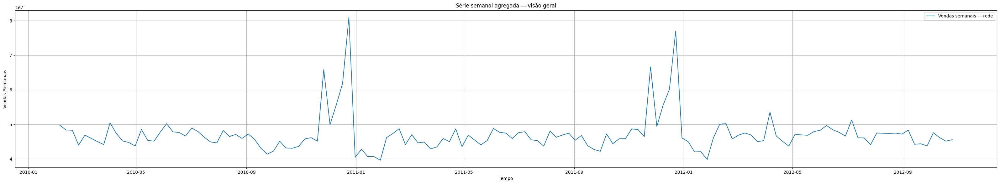

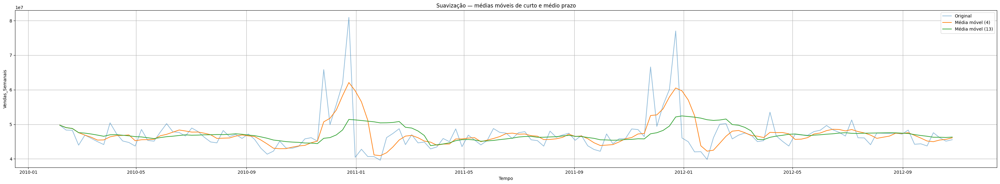

In [ ]:
# 2.1) Visão geral da série (nível e sazonalidade)
plt.figure(figsize=(32,6))
plt.plot(df_semanal.index, df_semanal.values, label='Vendas semanais — rede')
plt.title('Série semanal agregada — visão geral')
plt.xlabel('Tempo'); plt.ylabel('Vendas_Semanais'); plt.grid(True); plt.legend(); plt.tight_layout(); plt.show()

# Médias móveis: curto (~4 semanas) e médio (~13 semanas)
mm_curta = df_semanal.rolling(window=4, min_periods=1).mean()
mm_media = df_semanal.rolling(window=13, min_periods=1).mean()

plt.figure(figsize=(32,6))
plt.plot(df_semanal, alpha=0.5, label='Original')
plt.plot(mm_curta, label='Média móvel (4)')
plt.plot(mm_media, label='Média móvel (13)')
plt.title('Suavização — médias móveis de curto e médio prazo')
plt.xlabel('Tempo'); plt.ylabel('Vendas_Semanais'); plt.grid(True); plt.legend(); plt.tight_layout(); plt.show()


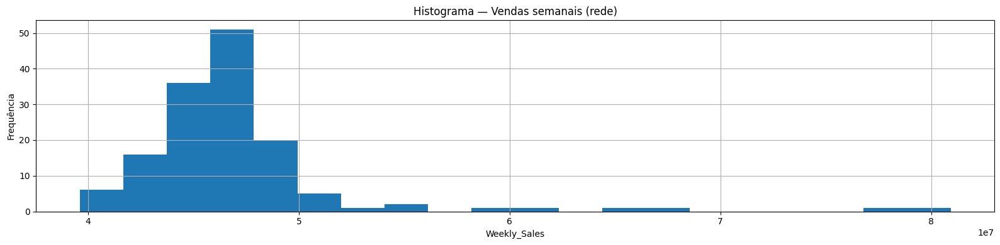

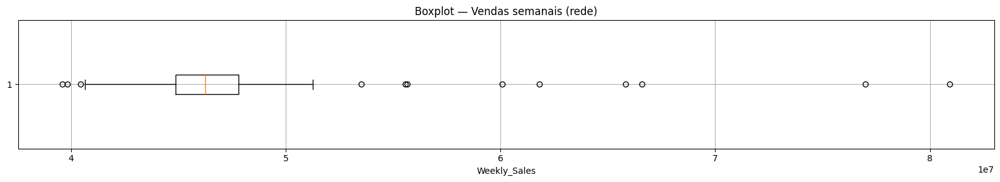

Possíveis outliers (|z|>3): 4


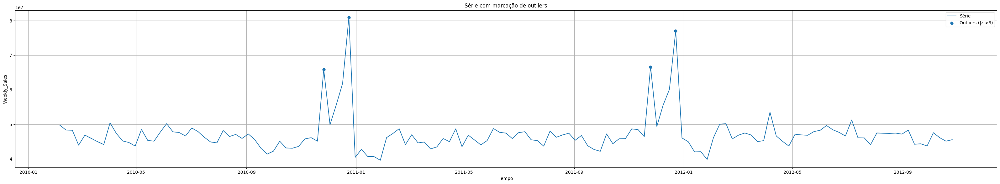

In [ ]:
# 2.2) Distribuição valor de Weekly_Sales (histograma e boxplot)

plt.figure(figsize=(16,4))
plt.hist(df_semanal.dropna().values, bins=20)
plt.title('Histograma — Vendas semanais (rede)')
plt.xlabel('Weekly_Sales'); plt.ylabel('Frequência'); plt.grid(True); plt.tight_layout()
plt.show()

plt.figure(figsize=(16,3))
plt.boxplot(df_semanal.dropna().values, vert=False)
plt.title('Boxplot — Vendas semanais (rede)')
plt.xlabel('Weekly_Sales'); plt.grid(True); plt.tight_layout()
plt.show()

# Outliers via z-score (> 3 desvios)
z = (df_semanal - df_semanal.mean()) / df_semanal.std()
outliers = df_semanal[np.abs(z) > 3]
print(f"Possíveis outliers (|z|>3): {outliers.shape[0]}")

plt.figure(figsize=(32,6))
plt.plot(df_semanal, label='Série')
if outliers.shape[0] > 0:
    plt.scatter(outliers.index, outliers.values, s=40, label='Outliers (|z|>3)')
plt.title('Série com marcação de outliers')
plt.xlabel('Tempo'); plt.ylabel('Weekly_Sales'); plt.grid(True); plt.legend(); plt.tight_layout()
plt.show()



In [ ]:
# 2.4) Agregar variáveis exógenas no mesmo índice semanal (média por semana)
exog_cols = [c for c in ['Holiday_Flag','Temperature','Fuel_Price','CPI','Unemployment'] if c in df.columns]

exog_semanal = (
    df.groupby('Date', as_index=True)[exog_cols]
      .mean()              # no caso de Holiday_Flag, o valor médio por semana ≈ proporção de lojas com feriado
      .sort_index()
      .asfreq('W-FRI')
      .interpolate()
)


eda = pd.concat([df_semanal.rename('Vendas_Semanais'), exog_semanal], axis=1)
print('Correlação (Pearson):')
display(eda.corr(numeric_only=True))

Correlação (Pearson):


,Vendas_Semanais,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Vendas_Semanais,1.000000,0.172683,-0.159160,-0.056722,0.023413,0.003524
Holiday_Flag,0.172683,1.000000,-0.189186,-0.084039,-0.027542,0.042639
Temperature,-0.159160,-0.189186,1.000000,0.205757,0.159457,-0.168460
Fuel_Price,-0.056722,-0.084039,0.205757,1.000000,0.824704,-0.747205
CPI,0.023413,-0.027542,0.159457,0.824704,1.000000,-0.977430
Unemployment,0.003524,0.042639,-0.168460,-0.747205,-0.977430,1.000000


Treino: 2010-02-05 → 2012-04-27 | 117
Teste : 2012-05-04 → 2012-10-26 | 26


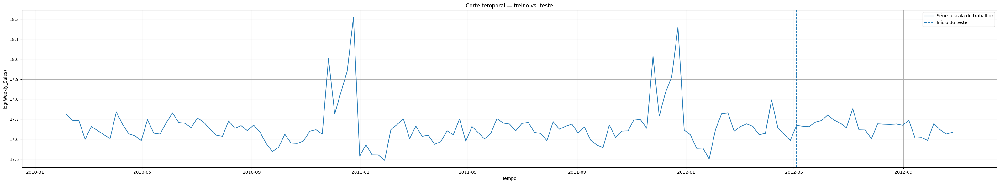

In [ ]:
# Log ajuda a estabilizar a variância quando picos crescem com o nível
USE_LOG = True
y = np.log(df_semanal) if USE_LOG else df_semanal.copy()
y_label = 'log(Weekly_Sales)' if USE_LOG else 'Weekly_Sales'

# Escolha uma janela de teste realista — aqui ~6 meses (26 semanas)
TEST_WEEKS = 26
y_train = y.iloc[:-TEST_WEEKS]
y_test  = y.iloc[-TEST_WEEKS:]

if exog_semanal is not None:
    X_exog_train = exog_semanal.loc[y_train.index]
    X_exog_test  = exog_semanal.loc[y_test.index]
else:
    X_exog_train = None
    X_exog_test  = None

print('Treino:', y_train.index.min().date(), '→', y_train.index.max().date(), '|', y_train.shape[0])
print('Teste :', y_test.index.min().date(),  '→', y_test.index.max().date(),  '|', y_test.shape[0])

# Visual do corte
plt.figure(figsize=(32,6))
plt.plot(y, label='Série (escala de trabalho)')
plt.axvline(y_test.index.min(), linestyle='--', label='Início do teste')
plt.title('Corte temporal — treino vs. teste')
plt.xlabel('Tempo'); plt.ylabel(y_label); plt.grid(True); plt.legend(); plt.tight_layout()
plt.show()


In [ ]:
# ============================================================
# Resumos estatísticos (para o texto do relatório)
# - Escala de trabalho: y  (pode ser log ou original)
# - Escala original:     df_semanal (ou exp(y) quando USE_LOG=True)
# - Quebra por treino/teste para facilitar interpretação
# ============================================================

# ============================================================
# Resumo estatístico formatado (melhor visual e leitura)
# ============================================================

def descrever_serie_formatada(serie: pd.Series) -> pd.DataFrame:
    """
    Retorna um resumo estatístico com valores formatados.
    Exibe separadores de milhar e duas casas decimais.
    """
    s = serie.dropna()
    media = float(s.mean())
    desc = {
        'n': int(s.shape[0]),
        'mean': media,
        'median': float(s.median()),
        'std': float(s.std()),
        'min': float(s.min()),
        'max': float(s.max()),
        'cv(%)': float(s.std()/media*100) if media != 0 else np.nan,
        'skew': float(s.skew()),
        'kurtosis': float(s.kurt())
    }
    df_desc = pd.DataFrame(desc, index=['valor']).T

    # Formatação dos valores (sem notação científica)
    def fmt(v, is_int=False, is_pct=False):
        if pd.isna(v):
            return "-"
        if is_int:
            return f"{int(v):,}".replace(",", ".")
        if is_pct:
            return f"{v:,.2f}%".replace(",", "X").replace(".", ",").replace("X", ".")
        return f"{v:,.2f}".replace(",", "X").replace(".", ",").replace("X", ".")

    df_desc['formatado'] = [
        fmt(v, is_int=True) if i == 'n' else
        fmt(v, is_pct=True) if i == 'cv(%)' else
        fmt(v)
        for i, v in zip(df_desc.index, df_desc['valor'])
    ]

    return df_desc[['formatado']]

# ======================
# Aplicação do resumo
# ======================

print("► Resumo — ESCALA DE TRABALHO (y)")
display(descrever_serie_formatada(y))

if 'y_train' in globals() and 'y_test' in globals():
    print("\n► Resumo (treino) — ESCALA DE TRABALHO")
    display(descrever_serie_formatada(y_train))
    print("\n► Resumo (teste) — ESCALA DE TRABALHO")
    display(descrever_serie_formatada(y_test))

if 'USE_LOG' in globals() and USE_LOG:
    y_original = np.exp(y)
    print("\n► Resumo — ESCALA ORIGINAL (exp(y))")
    display(descrever_serie_formatada(y_original))
    if 'y_train' in globals() and 'y_test' in globals():
        print("\n► Resumo (treino) — ESCALA ORIGINAL")
        display(descrever_serie_formatada(np.exp(y_train)))
        print("\n► Resumo (teste) — ESCALA ORIGINAL")
        display(descrever_serie_formatada(np.exp(y_test)))
else:
    print("\n► Resumo — ESCALA ORIGINAL (df_semanal)")
    display(descrever_serie_formatada(df_semanal))
    if 'y_train' in globals() and 'y_test' in globals():
        print("\n► Resumo (treino) — ESCALA ORIGINAL")
        display(descrever_serie_formatada(y_train))
        print("\n► Resumo (teste) — ESCALA ORIGINAL")
        display(descrever_serie_formatada(y_test))



► Resumo — ESCALA DE TRABALHO (y)


,formatado
n,143
mean,"17,66"
median,"17,65"
std,"0,10"
min,"17,49"
max,"18,21"
cv(%),"0,56%"
skew,"2,83"
kurtosis,"11,79"



► Resumo (treino) — ESCALA DE TRABALHO


,formatado
n,117
mean,"17,66"
median,"17,65"
std,"0,11"
min,"17,49"
max,"18,21"
cv(%),"0,61%"
skew,"2,66"
kurtosis,"9,77"



► Resumo (teste) — ESCALA DE TRABALHO


,formatado
n,26
mean,"17,66"
median,"17,67"
std,"0,04"
min,"17,59"
max,"17,75"
cv(%),"0,21%"
skew,"0,05"
kurtosis,"0,45"



► Resumo — ESCALA ORIGINAL (exp(y))


,formatado
n,143
mean,"47.113.419,49"
median,"46.243.899,58"
std,"5.444.206,20"
min,"39.599.852,99"
max,"80.931.415,60"
cv(%),"11,56%"
skew,"3,67"
kurtosis,"17,67"



► Resumo (treino) — ESCALA ORIGINAL


,formatado
n,117
mean,"47.166.450,73"
median,"46.042.461,04"
std,"5.968.638,51"
min,"39.599.852,99"
max,"80.931.415,60"
cv(%),"12,65%"
skew,"3,39"
kurtosis,"14,53"



► Resumo (teste) — ESCALA ORIGINAL


,formatado
n,26
mean,"46.874.778,91"
median,"47.141.918,68"
std,"1.726.539,91"
min,"43.734.899,40"
max,"51.253.021,88"
cv(%),"3,68%"
skew,"0,18"
kurtosis,"0,63"


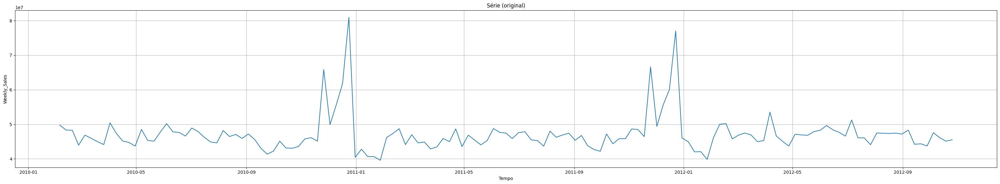

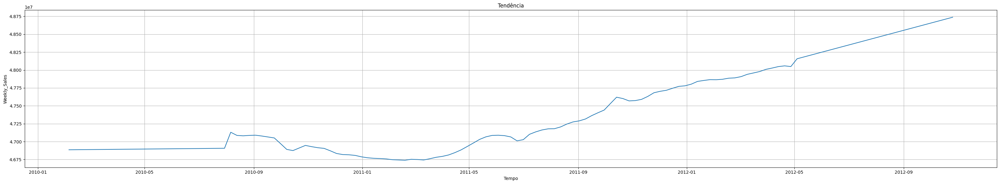

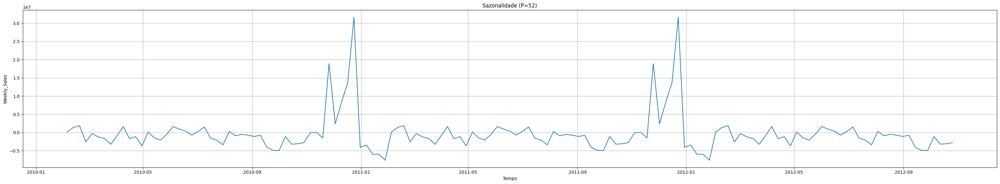

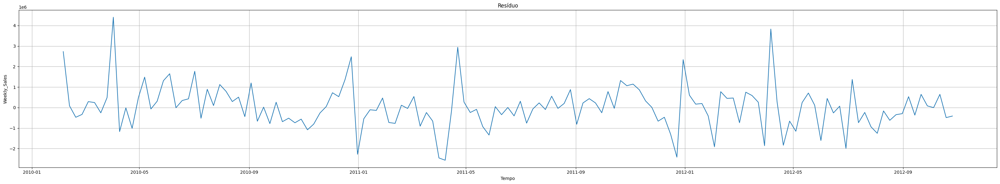

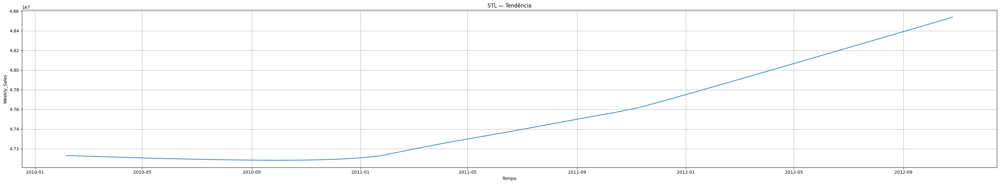

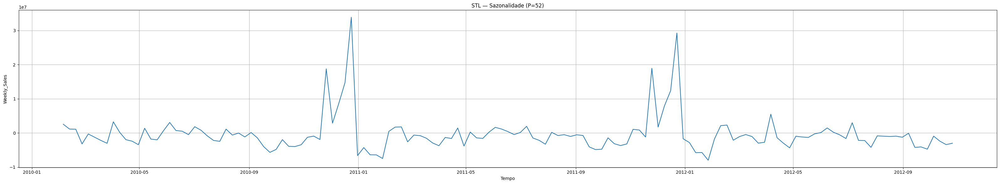

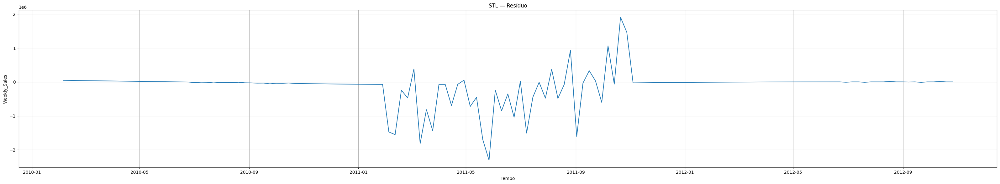

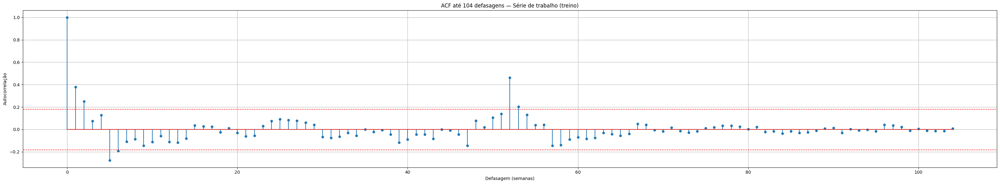

Período dominante (ignora lag 0): 52 semanas
Correlação |sazonal| vs nível (tendência): -0.027
Regra prática: correlação alta sugere sazonalidade multiplicativa; caso contrário, aditiva.


In [ ]:
# ============================================================
# Análise do df_semanal: decomposição + ACF + heurística aditivo/multiplicativo
# ============================================================
# ===== 6) DECOMPOSIÇÃO + ACF =====
periodo_sazonal = 52  # semanal ≈ 1 ano

# 6.1 decomposição aditiva
decomp = seasonal_decompose(df_semanal, model='additive', period=periodo_sazonal, extrapolate_trend='freq')

for titulo, comp in [
    ('Série (original)', df_semanal),
    ('Tendência', decomp.trend),
    (f'Sazonalidade (P={periodo_sazonal})', decomp.seasonal),
    ('Resíduo', decomp.resid)
]:
    plt.figure()
    plt.plot(comp.index, comp.values)
    plt.title(titulo); plt.xlabel('Tempo'); plt.ylabel('Weekly_Sales'); plt.tight_layout(); plt.show()

# (Opcional) STL robusto
try:
    stl = STL(df_semanal, period=periodo_sazonal, robust=True).fit()
    for titulo, comp in [
        ('STL — Tendência', stl.trend),
        (f'STL — Sazonalidade (P={periodo_sazonal})', stl.seasonal),
        ('STL — Resíduo', stl.resid)
    ]:
        plt.figure(); plt.plot(comp.index, comp.values)
        plt.title(titulo); plt.xlabel('Tempo'); plt.ylabel('Weekly_Sales'); plt.tight_layout(); plt.show()
except Exception as e:
    print("STL não pôde ser calculado aqui (ok).")

# 6.2 ACF (usa série de trabalho do treino, se houver)
serie_para_acf = y_train if 'y_train' in globals() else y
rotulo_acf = 'Série de trabalho (treino)' if 'y_train' in globals() else 'Série de trabalho'

nlags = min(104, len(serie_para_acf.dropna()) - 1)  # até 2 anos
acf_vals = acf(serie_para_acf.dropna(), nlags=nlags, fft=True)
lags = np.arange(len(acf_vals))

plt.figure()
markerline, stemlines, baseline = plt.stem(lags, acf_vals)   # sem use_line_collection (compatível 3.8+)
plt.setp(markerline, markersize=5)
plt.setp(stemlines, linewidth=1.5)
# linhas de confiança 95%
n = len(serie_para_acf.dropna())
conf = 1.96 / np.sqrt(n)
plt.axhline(y= conf, color='red', linestyle='--', linewidth=1)
plt.axhline(y=-conf, color='red', linestyle='--', linewidth=1)
plt.title(f'ACF até {nlags} defasagens — {rotulo_acf}')
plt.xlabel('Defasagem (semanas)'); plt.ylabel('Autocorrelação'); plt.tight_layout(); plt.show()

if len(lags) > 1:
    dom_lag = int(lags[1:][np.argmax(acf_vals[1:])])
    print('Período dominante (ignora lag 0):', dom_lag, 'semanas')

# 6.3 Heurística aditivo vs multiplicativo
tmp = pd.DataFrame({'nivel': decomp.trend, 'sazonal': decomp.seasonal}).dropna()
if not tmp.empty:
    corr_amp_nivel = tmp['nivel'].abs().corr(tmp['sazonal'].abs())
    print('Correlação |sazonal| vs nível (tendência):', round(float(corr_amp_nivel), 3))
    print('Regra prática: correlação alta sugere sazonalidade multiplicativa; caso contrário, aditiva.')




## 3.0 Função para medir performance

In [ ]:
def rmse(y_true, y_pred):
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

def mae(y_true, y_pred):
    return float(np.mean(np.abs(y_true - y_pred)))

def rmsse(y_train, y_true, y_pred):
    # Denominador: MSE dos passos à frente 1 no treino (Escala de trabalho)
    denom = np.mean((y_train[1:].values - y_train[:-1].values)**2)
    return float(np.sqrt(np.mean((y_true - y_pred)**2) / denom)) if denom > 0 else np.nan


# garante lista de resultados
if 'results' not in globals():
    results = []

seasonal_period = 52  # semanal ≈ 1 ano

# monta DataFrame contínuo de exógenas para treino/teste (se existir)
X_exog_full = None
if 'X_exog_train' in globals() and 'X_exog_test' in globals():
    try:
        X_exog_full = pd.concat([X_exog_train, X_exog_test], axis=0).sort_index()
    except Exception:
        X_exog_full = None

# Função de engenharia de atributos temporais (lags etc.) para ML
def criar_atributos_temporais(serie: pd.Series, max_lag: int = 8) -> pd.DataFrame:
    df_feat = pd.DataFrame({'y': serie})
    for atraso in range(1, max_lag + 1):
        df_feat[f'lag_{atraso}'] = df_feat['y'].shift(atraso)
    df_feat['mm_4']  = df_feat['y'].shift(1).rolling(4).mean()
    df_feat['mm_8']  = df_feat['y'].shift(1).rolling(8).mean()
    df_feat['dp_4']  = df_feat['y'].shift(1).rolling(4).std()
    df_feat['media_cum'] = df_feat['y'].shift(1).expanding().mean()
    df_feat['dp_cum']    = df_feat['y'].shift(1).expanding().std()
    df_feat['mes'] = df_feat.index.month
    df_feat['semana_ano'] = df_feat.index.isocalendar().week.astype(int)
    # Se tiver Holiday binário, é útil como feature
    if X_exog_full is not None and 'Holiday_Flag' in X_exog_full.columns:
        df_feat['Holiday_Flag'] = X_exog_full['Holiday_Flag']
    return df_feat.dropna()



In [ ]:
results

[]

## 3.1 Naive

[{'modelo': 'Naive', 'RMSE': 0.07794510543825652, 'MAE': 0.06909635780419002, 'RMSSE': 0.6468413356352447}, {'modelo': 'Seasonal-Naive (s=52)', 'RMSE': 0.14907368385156156, 'MAE': 0.09438896971008517, 'RMSSE': 1.2371145080686825}]


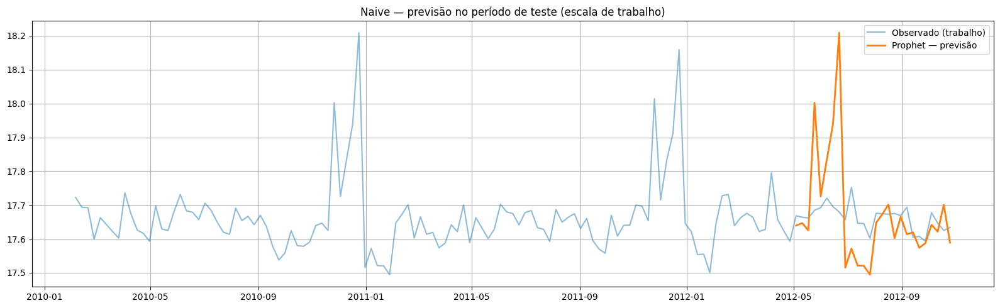

In [ ]:


# Naive: repete o último valor do treino
naive_fc = pd.Series(y_train.iloc[-1], index=y_test.index)
results.append({'modelo':'Naive', 'RMSE':rmse(y_test,naive_fc), 'MAE':mae(y_test,naive_fc), 'RMSSE':rmsse(y_train,y_test,naive_fc)})

# Sazonal-naive: usa o valor de 52 semanas atrás (se houver histórico)
if len(y_train) > seasonal_period:
    sn_fc = y_train.shift(seasonal_period).dropna().iloc[-len(y_test):]
    sn_fc.index = y_test.index
else:
    sn_fc = pd.Series(y_train.iloc[-1], index=y_test.index)
results.append({'modelo':'Seasonal-Naive (s=52)', 'RMSE':rmse(y_test,sn_fc), 'MAE':mae(y_test,sn_fc), 'RMSSE':rmsse(y_train,y_test,sn_fc)})
print(results)

# Visual (trabalho + original)
plt.figure(figsize=(16,5))
plt.plot(y, label='Observado (trabalho)', alpha=0.5)
plt.plot(sn_fc, label='Prophet — previsão', linewidth=2)
plt.title('Naive — previsão no período de teste (escala de trabalho)')
plt.legend(); plt.tight_layout(); plt.show()

In [ ]:
results

[{'modelo': 'Naive',
  'RMSE': 0.07794510543825652,
  'MAE': 0.06909635780419002,
  'RMSSE': 0.6468413356352447},
 {'modelo': 'Seasonal-Naive (s=52)',
  'RMSE': 0.14907368385156156,
  'MAE': 0.09438896971008517,
  'RMSSE': 1.2371145080686825}]

## 3.2 Holt–Winters Aditivo/Multiplicativo


Período sazonal usado: 52
Sazonalidade no HW: add


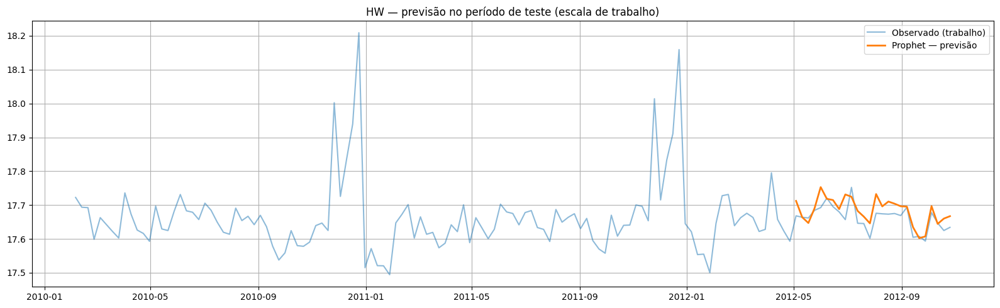

In [ ]:


# Se o treino for curto para 52, reduza para 26
if len(y_train.dropna()) < 2 * seasonal_period:
    seasonal_period = 26

# Garante tipo inteiro (evita bool/timedelta/Series)
seasonal_period = int(seasonal_period)
print("Período sazonal usado:", seasonal_period)




y_train_hw = pd.Series(y_train).astype(float).dropna()
y_test_hw  = pd.Series(y_test).astype(float)   # test pode ficar com NaN só se seu split tiver buracos

use_multiplicative = (not USE_LOG) and (y_train_hw.min() > 0)
seasonal_mode = 'mul' if use_multiplicative else 'add'
print("Sazonalidade no HW:", seasonal_mode)


try:
    hw = ExponentialSmoothing(
        y_train_hw,
        trend='add',
        seasonal=seasonal_mode,
        seasonal_periods=seasonal_period,
        initialization_method='estimated'
    ).fit()
    hw_fc = hw.forecast(len(y_test_hw))
    results.append({
        'modelo': f'Holt–Winters ({seasonal_mode}, s={seasonal_period})',
        'RMSE': rmse(y_test, hw_fc),
        'MAE':  mae(y_test,  hw_fc),
        'RMSSE':rmsse(y_train, y_test, hw_fc)
    })
except Exception as e:
    print("Holt–Winters falhou:", e)

# Visual (trabalho + original)
plt.figure(figsize=(16,5))
plt.plot(y, label='Observado (trabalho)', alpha=0.5)
plt.plot(hw_fc, label='Prophet — previsão', linewidth=2)
plt.title('HW — previsão no período de teste (escala de trabalho)')
plt.legend(); plt.tight_layout(); plt.show()

In [ ]:
results

[{'modelo': 'Naive',
  'RMSE': 0.07794510543825652,
  'MAE': 0.06909635780419002,
  'RMSSE': 0.6468413356352447},
 {'modelo': 'Seasonal-Naive (s=52)',
  'RMSE': 0.14907368385156156,
  'MAE': 0.09438896971008517,
  'RMSSE': 1.2371145080686825},
 {'modelo': 'Holt–Winters (add, s=52)',
  'RMSE': 0.03210332776814983,
  'MAE': 0.02583682069624502,
  'RMSSE': 0.26641518149379473}]

## 3.3 SARIMAX + exógenas

Período sazonal (SARIMAX): 52
Exógenas após limpeza: ['Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
Tentativas: 16 | Erros de ajuste: 0
Melhor SARIMAX: (0, 1, 1, 1, 1, 0, 52) | AIC: -34.48 | Exógenas: ['Fuel_Price', 'CPI', 'Unemployment', 'Temperature']


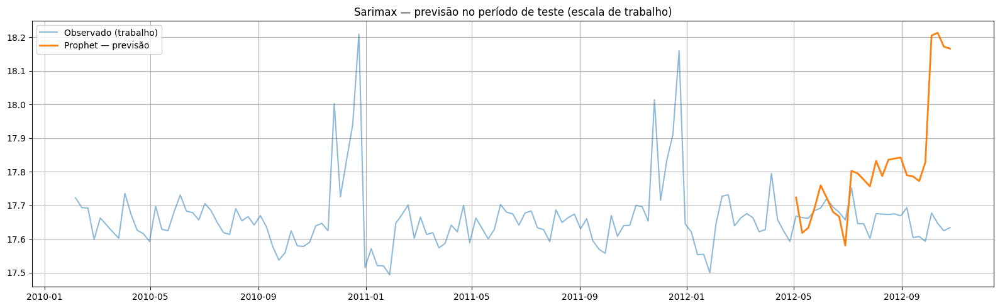

In [ ]:
# ============================================================
# SARIMAX ROBUSTO COM EXÓGENAS (com higienização + fallbacks)
# ============================================================


# 0) Período sazonal seguro
SEASONAL_PERIOD = 52
if len(y_train.dropna()) < 2 * SEASONAL_PERIOD:
    SEASONAL_PERIOD = 26
SEASONAL_PERIOD = int(SEASONAL_PERIOD)
print("Período sazonal (SARIMAX):", SEASONAL_PERIOD)

# 1) Higienização das exógenas (tipo, NaN, constantes, colinearidade, escala)
def preparar_exogenas(Xtr: pd.DataFrame, Xte: pd.DataFrame):
    # forçar numérico
    Xtr = Xtr.apply(pd.to_numeric, errors='coerce').astype(float)
    Xte = Xte.apply(pd.to_numeric, errors='coerce').astype(float)

    # manter interseção de colunas e mesmas ordens
    col_comum = Xtr.columns.intersection(Xte.columns)
    Xtr = Xtr[col_comum].copy()
    Xte = Xte[col_comum].copy()

    # preencher NaN (ffill/bfill) e remover colunas all-NaN
    Xtr = Xtr.fillna(method='ffill').fillna(method='bfill')
    Xte = Xte.fillna(method='ffill').fillna(method='bfill')
    drop_nan = [c for c in Xtr.columns if Xtr[c].isna().all() or Xte[c].isna().all()]
    if drop_nan:
        Xtr = Xtr.drop(columns=drop_nan)
        Xte = Xte.drop(columns=drop_nan)

    # remover colunas quase constantes (std ~ 0)
    keep = [c for c in Xtr.columns if Xtr[c].std() > 1e-8]
    Xtr = Xtr[keep]; Xte = Xte[keep]

    # remover colinearidade forte (|corr|>0.98 entre preditores)
    if Xtr.shape[1] >= 2:
        corr = Xtr.corr().abs()
        upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
        to_drop = [c for c in upper.columns if (upper[c] > 0.98).any()]
        if to_drop:
            Xtr = Xtr.drop(columns=to_drop, errors='ignore')
            Xte = Xte.drop(columns=to_drop, errors='ignore')

    # padronizar (z-score) para estabilizar a otimização
    mu = Xtr.mean()
    sigma = Xtr.std().replace(0, 1)
    Xtr_z = (Xtr - mu) / sigma
    Xte_z = (Xte - mu) / sigma

    return Xtr_z, Xte_z

X_exog_train_z, X_exog_test_z = preparar_exogenas(X_exog_train, X_exog_test)
print("Exógenas após limpeza:", list(X_exog_train_z.columns))

# 2) Conjuntos de exógenas a testar (do simples ao completo)
colunas_possiveis = list(X_exog_train_z.columns)
conjuntos_exog = []

if 'Holiday_Flag_bin' in colunas_possiveis:
    conjuntos_exog += [['Holiday_Flag_bin']]
if 'Holiday_Flag' in colunas_possiveis:
    conjuntos_exog += [['Holiday_Flag']]

# conjuntos econômicos
economicas = [c for c in ['Fuel_Price','CPI','Unemployment','Temperature'] if c in colunas_possiveis]
if economicas:
    conjuntos_exog += [economicas]

# feriado + econômicas
if 'Holiday_Flag_bin' in colunas_possiveis and economicas:
    conjuntos_exog += [['Holiday_Flag_bin'] + economicas]
if 'Holiday_Flag' in colunas_possiveis and economicas:
    conjuntos_exog += [['Holiday_Flag'] + economicas]

# todas
if colunas_possiveis:
    conjuntos_exog += [colunas_possiveis]

# dedup mantendo ordem
seen = set(); conjuntos_novos = []
for cols in conjuntos_exog:
    t = tuple(cols)
    if t not in seen and len(cols) >= 1:
        conjuntos_novos.append(cols); seen.add(t)
conjuntos_exog = conjuntos_novos

# 3) Grade de parâmetros (curta e eficaz)
# Comece com combinações clássicas e só depois amplie:
grade_prioritaria = [
    ((0,1,1), (0,1,1,SEASONAL_PERIOD)),
    ((1,1,1), (0,1,1,SEASONAL_PERIOD)),
    ((1,1,0), (0,1,1,SEASONAL_PERIOD)),
    ((0,1,1), (1,1,0,SEASONAL_PERIOD)),
]
grade_extra = [
    ((0,1,0), (0,1,1,SEASONAL_PERIOD)),
    ((1,1,0), (1,1,0,SEASONAL_PERIOD)),
    ((0,1,1), (1,1,1,SEASONAL_PERIOD)),
]

def tentar_grade(y_tr, Xtr, y_te, Xte, grade):
    best = {'aic': np.inf, 'cfg': None, 'fit': None}
    erros = 0; tentativas = 0
    for (p,d,q), (P,D,Q,s) in grade:
        tentativas += 1
        try:
            mod = SARIMAX(
                y_tr, order=(p,d,q), seasonal_order=(P,D,Q,s),
                exog=Xtr if Xtr is not None and Xtr.shape[1] > 0 else None,
                enforce_stationarity=False, enforce_invertibility=False,
            )
            fit = mod.fit(disp=False)
            if fit.aic < best['aic']:
                best = {'aic': fit.aic, 'cfg': (p,d,q,P,D,Q,s), 'fit': fit}
        except Exception as e:
            erros += 1
    return best, tentativas, erros

best_aic = np.inf; best_cfg = None; best_fit = None; best_cols = None
total_tentativas = 0; total_erros = 0

# 4) Busca: começa do mais simples
for cols in (conjuntos_exog if conjuntos_exog else [[]]):
    Xtr = X_exog_train_z[cols] if cols else None
    Xte = X_exog_test_z[cols]  if cols else None

    # grade prioritária
    res, t, e = tentar_grade(y_train, Xtr, y_test, Xte, grade_prioritaria)
    total_tentativas += t; total_erros += e
    if res['fit'] is not None and res['aic'] < best_aic:
        best_aic = res['aic']; best_cfg = res['cfg']; best_fit = res['fit']; best_cols = cols

    # se ainda não achou nada bom, tenta grade extra
    if best_fit is None or res['aic'] == np.inf:
        res2, t2, e2 = tentar_grade(y_train, Xtr, y_test, Xte, grade_extra)
        total_tentativas += t2; total_erros += e2
        if res2['fit'] is not None and res2['aic'] < best_aic:
            best_aic = res2['aic']; best_cfg = res2['cfg']; best_fit = res2['fit']; best_cols = cols

print(f"Tentativas: {total_tentativas} | Erros de ajuste: {total_erros}")

if best_fit is not None:
    sarimax_fc = best_fit.forecast(steps=len(y_test), exog=(X_exog_test_z[best_cols] if best_cols else None))
    results.append({
        'modelo': f"SARIMAX{best_cfg}" + (f" + exógenas {best_cols}" if best_cols else ""),
        'RMSE': rmse(y_test, sarimax_fc),
        'MAE':  mae(y_test,  sarimax_fc),
        'RMSSE':rmsse(y_train, y_test, sarimax_fc)
    })
    print("Melhor SARIMAX:", best_cfg, "| AIC:", round(best_aic,2), "| Exógenas:", best_cols if best_cols else "nenhuma")
else:
    print("Nenhuma especificação com exógenas ajustou — tentando SARIMA (sem exógenas).")
    # Fallback: SARIMA puro
    best_sarima = None; best_aic2 = np.inf
    for (p,d,q), (P,D,Q,s) in grade_prioritaria + grade_extra:
        try:
            mod = SARIMAX(y_train, order=(p,d,q), seasonal_order=(P,D,Q,s),
                          exog=None, enforce_stationarity=False, enforce_invertibility=False)
            fit = mod.fit(disp=False)
            if fit.aic < best_aic2:
                best_aic2 = fit.aic; best_sarima = fit; best_cfg = (p,d,q,P,D,Q,s)
        except Exception:
            pass
    if best_sarima is not None:
        sarimax_fc = best_sarima.forecast(steps=len(y_test))
        results.append({
            'modelo': f"SARIMA{best_cfg} (sem exógenas)",
            'RMSE': rmse(y_test, sarimax_fc),
            'MAE':  mae(y_test,  sarimax_fc),
            'RMSSE':rmsse(y_train, y_test, sarimax_fc)
        })
        print("Fallback SARIMA escolhido:", best_cfg, "| AIC:", round(best_aic2,2))
    else:
        print("Nem o SARIMA simples ajustou. Verifique: NaNs em y_train, tamanho do treino e integridade do índice temporal.")

# Visual (trabalho + original)
plt.figure(figsize=(16,5))
plt.plot(y, label='Observado (trabalho)', alpha=0.5)
plt.plot(sarimax_fc, label='Prophet — previsão', linewidth=2)
plt.title('Sarimax — previsão no período de teste (escala de trabalho)')
plt.legend(); plt.tight_layout(); plt.show()

In [ ]:
results

[{'modelo': 'Naive',
  'RMSE': 0.07794510543825652,
  'MAE': 0.06909635780419002,
  'RMSSE': 0.6468413356352447},
 {'modelo': 'Seasonal-Naive (s=52)',
  'RMSE': 0.14907368385156156,
  'MAE': 0.09438896971008517,
  'RMSSE': 1.2371145080686825},
 {'modelo': 'Holt–Winters (add, s=52)',
  'RMSE': 0.03210332776814983,
  'MAE': 0.02583682069624502,
  'RMSSE': 0.26641518149379473},
 {'modelo': "SARIMAX(0, 1, 1, 1, 1, 0, 52) + exógenas ['Fuel_Price', 'CPI', 'Unemployment', 'Temperature']",
  'RMSE': 0.2408643039520451,
  'MAE': 0.1697492519137961,
  'RMSSE': 1.998855312327606}]

## 3.4 Prophet

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9_o4r5cw/2y2xn6cd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9_o4r5cw/4owderko.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.12/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14550', 'data', 'file=/tmp/tmp9_o4r5cw/2y2xn6cd.json', 'init=/tmp/tmp9_o4r5cw/4owderko.json', 'output', 'file=/tmp/tmp9_o4r5cw/prophet_modelhkp1l5ng/prophet_model-20251012222327.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:23:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:23:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


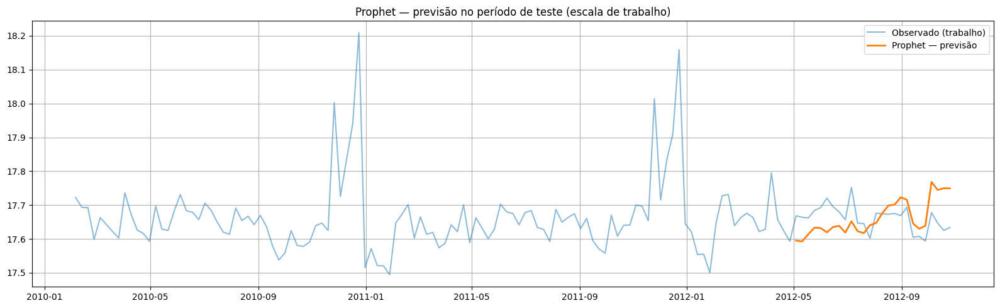

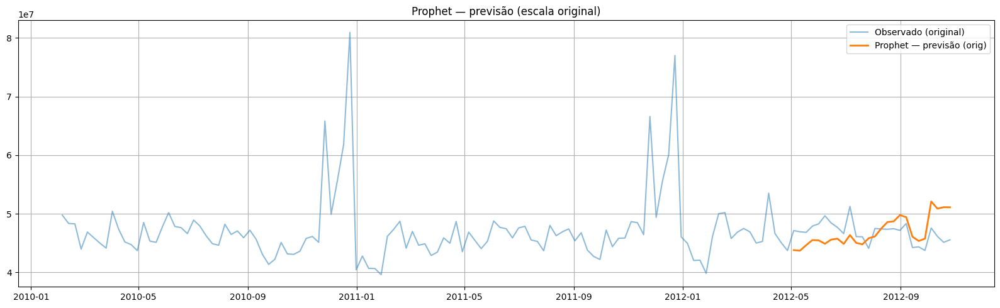

In [ ]:
# =========================
# 1) PROPHET (facebook/prophet)
# =========================
import sys, subprocess
def _ensure_prophet():
    try:
        import prophet
        return 'prophet'
    except Exception:
        pass
    try:
        import fbprophet
        return 'fbprophet'
    except Exception:
        pass
    # tenta instalar
    try:
        print("Instalando prophet ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "prophet"])
        import prophet
        return 'prophet'
    except Exception as e:
        print("Falha ao instalar prophet:", repr(e))
        return None

_pkg = _ensure_prophet()
if _pkg is not None:
    if _pkg == 'prophet':
        from prophet import Prophet
    else:
        from fbprophet import Prophet

    # Prepara df para Prophet (colunas ds, y) na escala de trabalho (y)
    df_prophet = pd.DataFrame({'ds': y.index, 'y': y.values})
    # Adiciona regressoras exógenas, se existirem
    extras = []
    if X_exog_full is not None:
        # escolha regressoras úteis (inclusive holiday binário)
        for c in ['Holiday_Flag_bin','Fuel_Price','CPI','Unemployment','Temperature']:
            if (X_exog_full is not None) and (c in X_exog_full.columns):
                df_prophet[c] = X_exog_full[c].reindex(df_prophet['ds']).values
                extras.append(c)

    # Define o modelo
    m = Prophet(weekly_seasonality=True, yearly_seasonality=True, daily_seasonality=False)
    for c in extras:
        m.add_regressor(c)

    # Treino: até o fim do y_train
    corte = y_train.index.max()
    df_train_prophet = df_prophet[df_prophet['ds'] <= corte].copy()

    # Ajuste
    m.fit(df_train_prophet)

    # Janela de previsão = len(y_test)
    periodos = len(y_test)
    future = pd.DataFrame({'ds': y_test.index})
    # Preenche regressoras no futuro (y_test)
    for c in extras:
        future[c] = df_prophet.set_index('ds')[c].reindex(future['ds']).values

    fc_prophet = m.predict(future)
    yhat_prophet = pd.Series(fc_prophet['yhat'].values, index=y_test.index)

    results.append({
        'modelo': 'Prophet' + (f' + {len(extras)} regressoras' if extras else ''),
        'RMSE': rmse(y_test, yhat_prophet),
        'MAE':  mae(y_test,  yhat_prophet),
        'RMSSE':rmsse(y_train, y_test, yhat_prophet)
    })

    # Visual (trabalho + original)
    plt.figure(figsize=(16,5))
    plt.plot(y, label='Observado (trabalho)', alpha=0.5)
    plt.plot(yhat_prophet, label='Prophet — previsão', linewidth=2)
    plt.title('Prophet — previsão no período de teste (escala de trabalho)')
    plt.legend(); plt.tight_layout(); plt.show()

    if 'USE_LOG' in globals() and USE_LOG:
        plt.figure(figsize=(16,5))
        plt.plot(np.exp(y), label='Observado (original)', alpha=0.5)
        plt.plot(yhat_prophet.index, np.exp(yhat_prophet.values), label='Prophet — previsão (orig)', linewidth=2)
        plt.title('Prophet — previsão (escala original)')
        plt.legend(); plt.tight_layout(); plt.show()
else:
    print("Prophet indisponível neste ambiente; pulei este modelo.")


In [ ]:
results

[{'modelo': 'Naive',
  'RMSE': 0.07794510543825652,
  'MAE': 0.06909635780419002,
  'RMSSE': 0.6468413356352447},
 {'modelo': 'Seasonal-Naive (s=52)',
  'RMSE': 0.14907368385156156,
  'MAE': 0.09438896971008517,
  'RMSSE': 1.2371145080686825},
 {'modelo': 'Holt–Winters (add, s=52)',
  'RMSE': 0.03210332776814983,
  'MAE': 0.02583682069624502,
  'RMSSE': 0.26641518149379473},
 {'modelo': 'Prophet + 4 regressoras',
  'RMSE': 0.06362662286124775,
  'MAE': 0.05498339227712593,
  'RMSSE': 0.5280168585586312}]

## 3.5 XGBOOST

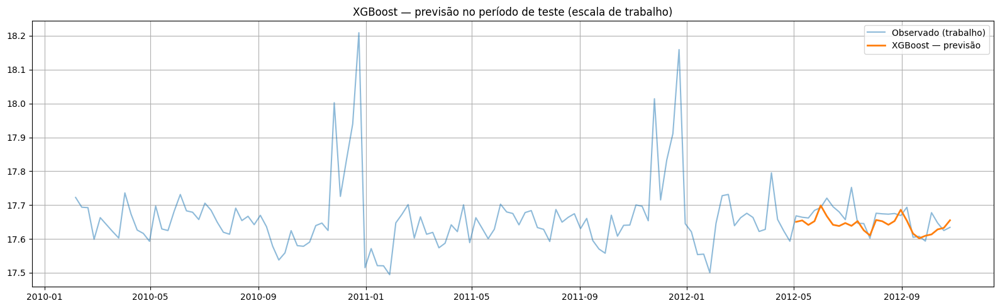

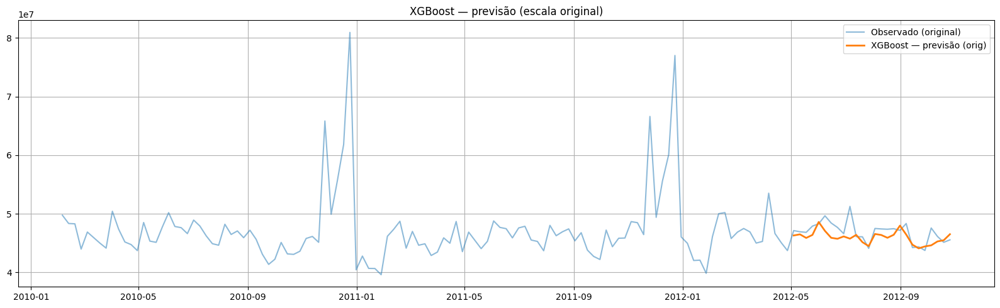

In [ ]:
# =========================
# 2) XGBOOST REGRESSOR
# =========================
import sys, subprocess
def _ensure_xgboost():
    try:
        import xgboost
        return True
    except Exception:
        pass
    try:
        print("Instalando xgboost ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "xgboost"])
        import xgboost
        return True
    except Exception as e:
        print("Falha ao instalar xgboost:", repr(e))
        return False

if _ensure_xgboost():
    from xgboost import XGBRegressor

    # Construção das features a partir da série de trabalho y
    feat = criar_atributos_temporais(y)
    X_all = feat.drop(columns=['y'])
    y_all = feat['y']

    # Split temporal mantendo o seu corte
    X_tr = X_all.loc[X_all.index.intersection(y_train.index)]
    y_tr = y_all.loc[X_tr.index]
    X_te = X_all.loc[X_all.index.intersection(y_test.index)]
    y_te = y_all.loc[X_te.index]

    # Modelo enxuto (parâmetros conservadores)
    xgb = XGBRegressor(
        n_estimators=600,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42,
        n_jobs=-1
    )
    xgb.fit(X_tr, y_tr)
    yhat_xgb = pd.Series(xgb.predict(X_te), index=X_te.index)

    results.append({
        'modelo': 'XGBoost (lags + rolling + calend.)',
        'RMSE': rmse(y_te, yhat_xgb),
        'MAE':  mae(y_te,  yhat_xgb),
        'RMSSE':rmsse(y_tr, y_te, yhat_xgb)
    })

    # Plot
    plt.figure(figsize=(16,5))
    plt.plot(y, label='Observado (trabalho)', alpha=0.5)
    plt.plot(yhat_xgb, label='XGBoost — previsão', linewidth=2)
    plt.title('XGBoost — previsão no período de teste (escala de trabalho)')
    plt.legend(); plt.tight_layout(); plt.show()

    if 'USE_LOG' in globals() and USE_LOG:
        plt.figure(figsize=(16,5))
        plt.plot(np.exp(y), label='Observado (original)', alpha=0.5)
        plt.plot(yhat_xgb.index, np.exp(yhat_xgb.values), label='XGBoost — previsão (orig)', linewidth=2)
        plt.title('XGBoost — previsão (escala original)')
        plt.legend(); plt.tight_layout(); plt.show()
else:
    print("XGBoost indisponível; pulei este modelo.")


## 3.6 CATBOSST







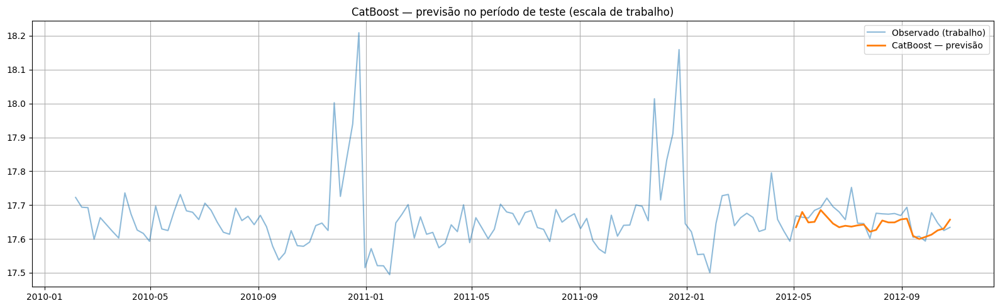

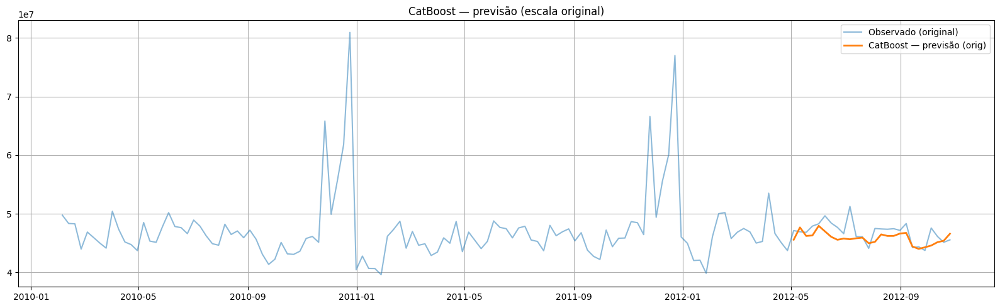

In [ ]:
# =========================
# 3) CATBOOST REGRESSOR
# =========================
import sys, subprocess
def _ensure_catboost():
    try:
        import catboost
        return True
    except Exception:
        pass
    try:
        print("Instalando catboost ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "catboost"])
        import catboost
        return True
    except Exception as e:
        print("Falha ao instalar catboost:", repr(e))
        return False

if _ensure_catboost():
    from catboost import CatBoostRegressor, Pool

    feat = criar_atributos_temporais(y)
    X_all = feat.drop(columns=['y'])
    y_all = feat['y']

    X_tr = X_all.loc[X_all.index.intersection(y_train.index)]
    y_tr = y_all.loc[X_tr.index]
    X_te = X_all.loc[X_all.index.intersection(y_test.index)]
    y_te = y_all.loc[X_te.index]

    # CatBoost com parâmetros leves
    cat = CatBoostRegressor(
        depth=6, learning_rate=0.08, iterations=1200,
        loss_function='RMSE', random_seed=42, verbose=False
    )
    cat.fit(X_tr, y_tr)
    yhat_cat = pd.Series(cat.predict(X_te), index=X_te.index)

    results.append({
        'modelo': 'CatBoost (lags + rolling + calend.)',
        'RMSE': rmse(y_te, yhat_cat),
        'MAE':  mae(y_te,  yhat_cat),
        'RMSSE':rmsse(y_tr, y_te, yhat_cat)
    })

    # Plot
    plt.figure(figsize=(16,5))
    plt.plot(y, label='Observado (trabalho)', alpha=0.5)
    plt.plot(yhat_cat, label='CatBoost — previsão', linewidth=2)
    plt.title('CatBoost — previsão no período de teste (escala de trabalho)')
    plt.legend(); plt.tight_layout(); plt.show()

    if 'USE_LOG' in globals() and USE_LOG:
        plt.figure(figsize=(16,5))
        plt.plot(np.exp(y), label='Observado (original)', alpha=0.5)
        plt.plot(yhat_cat.index, np.exp(yhat_cat.values), label='CatBoost — previsão (orig)', linewidth=2)
        plt.title('CatBoost — previsão (escala original)')
        plt.legend(); plt.tight_layout(); plt.show()
else:
    print("CatBoost indisponível; pulei este modelo.")


## 3.7 LSTM

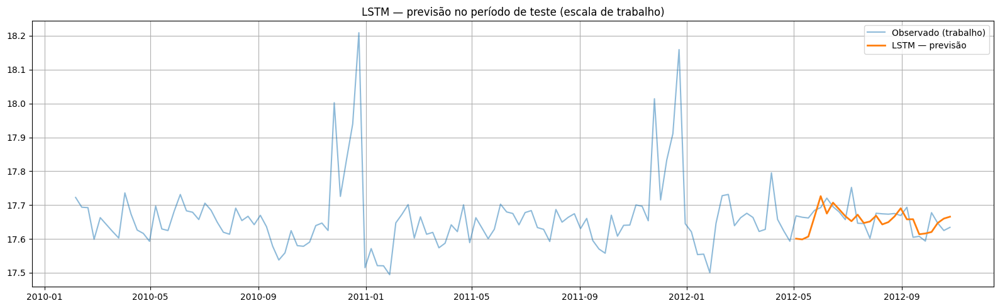

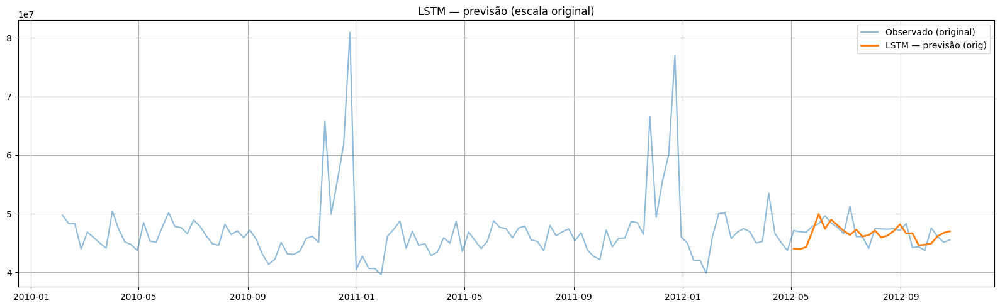

In [ ]:
# =========================
# 4) LSTM (Keras/TensorFlow)
# =========================
import sys, subprocess
def _ensure_tf():
    try:
        import tensorflow as tf
        return True
    except Exception:
        pass
    try:
        print("Instalando tensorflow ... (pode demorar)")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "tensorflow"])
        import tensorflow as tf
        return True
    except Exception as e:
        print("Falha ao instalar tensorflow:", repr(e))
        return False

if _ensure_tf():
    import tensorflow as tf
    from tensorflow.keras import layers, models
    from sklearn.preprocessing import StandardScaler

    # --------- Preparação univariada (y) com janela deslizante ---------
    janela = 8    # usa 8 semanas anteriores para prever a próxima
    horizonte = len(y_test)  # prevemos o mesmo tamanho do teste via walk-forward

    # escala (padronização) na ESCALA DE TRABALHO
    scaler_y = StandardScaler()
    y_tr_np = y_train.values.reshape(-1,1)
    y_te_np = y_test.values.reshape(-1,1)
    y_tr_scaled = scaler_y.fit_transform(y_tr_np)
    y_te_scaled = scaler_y.transform(y_te_np)

    # função para construir X (amostras, timesteps, features) e y
    def montar_sequencias(y_array, window):
        X_seq, y_seq = [], []
        for i in range(window, len(y_array)):
            X_seq.append(y_array[i-window:i, :])  # timesteps x features(=1)
            y_seq.append(y_array[i, 0])
        return np.array(X_seq), np.array(y_seq)

    X_tr_seq, y_tr_seq = montar_sequencias(y_tr_scaled, janela)

    # Modelo simples LSTM
    tf.random.set_seed(42)
    model = models.Sequential([
        layers.Input(shape=(X_tr_seq.shape[1], X_tr_seq.shape[2])),
        layers.LSTM(64, return_sequences=False),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    hist = model.fit(X_tr_seq, y_tr_seq, epochs=120, batch_size=16, verbose=0)

    # --------- Previsão walk-forward sobre o teste ---------
    # constrói uma fila com as últimas 'janela' observações (treino + teste)
    y_total_scaled = np.concatenate([y_tr_scaled, y_te_scaled], axis=0).flatten()
    preds_scaled = []
    for t in range(len(y_test)):
        start = len(y_tr_scaled) - janela + t
        end   = len(y_tr_scaled) + t
        janela_input = y_total_scaled[start:end]  # tamanho = janela
        X_input = janela_input.reshape(1, janela, 1)
        pred_t = model.predict(X_input, verbose=0)[0][0]
        preds_scaled.append(pred_t)

        # Obs.: estamos fazendo *one-step ahead* condicionado na janela com dados "reais" (não recursivo)
        # Uma alternativa é realimentar a previsão na janela; aqui mantemos simples para estabilidade.

    yhat_lstm = pd.Series(
        scaler_y.inverse_transform(np.array(preds_scaled).reshape(-1,1)).flatten(),
        index=y_test.index
    )

    results.append({
        'modelo': 'LSTM (janela=8)',
        'RMSE': rmse(y_test, yhat_lstm),
        'MAE':  mae(y_test,  yhat_lstm),
        'RMSSE':rmsse(y_train, y_test, yhat_lstm)
    })

    # Visualizações
    plt.figure(figsize=(16,5))
    plt.plot(y, label='Observado (trabalho)', alpha=0.5)
    plt.plot(yhat_lstm, label='LSTM — previsão', linewidth=2)
    plt.title('LSTM — previsão no período de teste (escala de trabalho)')
    plt.legend(); plt.tight_layout(); plt.show()

    if 'USE_LOG' in globals() and USE_LOG:
        plt.figure(figsize=(16,5))
        plt.plot(np.exp(y), label='Observado (original)', alpha=0.5)
        plt.plot(yhat_lstm.index, np.exp(yhat_lstm.values), label='LSTM — previsão (orig)', linewidth=2)
        plt.title('LSTM — previsão (escala original)')
        plt.legend(); plt.tight_layout(); plt.show()
else:
    print("TensorFlow indisponível; pulei LSTM.")


,modelo,RMSE,MAE,RMSSE
0,"Holt–Winters (add, s=52)",0.032103,0.025837,0.266415
1,XGBoost (lags + rolling + calend.),0.035325,0.026521,0.285637
2,CatBoost (lags + rolling + calend.),0.036862,0.027736,0.298068
3,LSTM (janela=8),0.039749,0.031752,0.329866
4,Prophet + 4 regressoras,0.063627,0.054983,0.528017
5,Naive,0.077945,0.069096,0.646841
6,Seasonal-Naive (s=52),0.149074,0.094389,1.237115


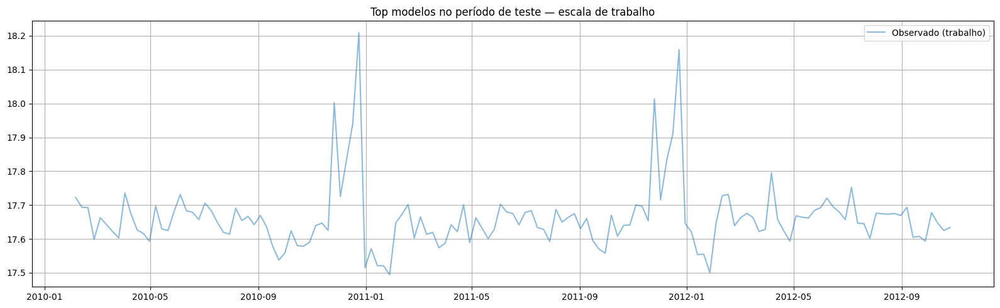

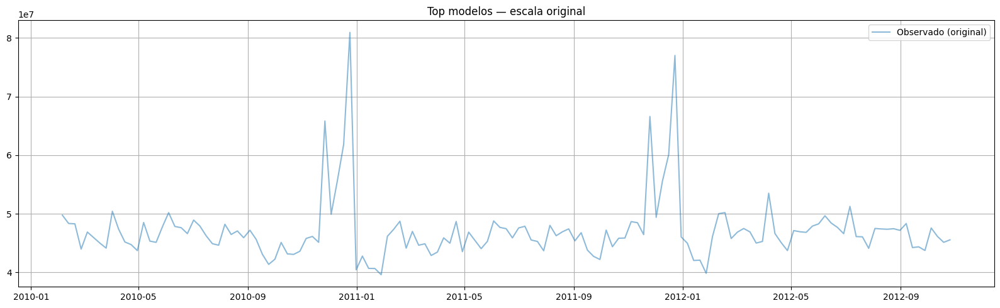

In [ ]:
# =========================
# 5) TABELA FINAL
# =========================
tabela = pd.DataFrame(results).sort_values(by=['RMSSE','RMSE','MAE']).reset_index(drop=True)
display(tabela)

# Gráfico final (top-3) na ESCALA DE TRABALHO
# Monte um dicionário com as previsões que você já criou antes (ex.: naive_fc, sn_fc, hw_fc, sarimax_fc, hibrido_fc, auto_fc, yhat_prophet, yhat_xgb, yhat_cat, yhat_lstm)
previsoes = {}
for name in ['naive_fc','sn_fc','hw_fc','sarimax_fc','hibrido_fc','auto_fc','yhat_prophet','yhat_xgb','yhat_cat','yhat_lstm']:
    if name in globals():
        previsoes[name] = globals()[name]

top_k = min(3, len(tabela))
top_names = tabela.head(top_k)['modelo'].tolist()

plt.figure(figsize=(16,5))
plt.plot(y, label='Observado (trabalho)', alpha=0.5)
for model_name in top_names:
    # tenta mapear pelo início do rótulo aos objetos salvos
    for key, series in previsoes.items():
        if model_name.split(' ')[0].lower() in key.lower() or model_name.split('(')[0].strip().lower() in key.lower():
            plt.plot(series.index, series.values, label=model_name)
            break
plt.title('Top modelos no período de teste — escala de trabalho')
plt.legend(); plt.tight_layout(); plt.show()

# Escala original
if 'USE_LOG' in globals() and USE_LOG:
    plt.figure(figsize=(16,5))
    plt.plot(np.exp(y), label='Observado (original)', alpha=0.5)
    for model_name in top_names:
        for key, series in previsoes.items():
            if model_name.split(' ')[0].lower() in key.lower() or model_name.split('(')[0].strip().lower() in key.lower():
                plt.plot(series.index, np.exp(series.values), label=model_name+' (orig)')
                break
    plt.title('Top modelos — escala original')
    plt.legend(); plt.tight_layout(); plt.show()

In [ ]:
def backtest_expanding(y, fit_fn, pred_fn, X=None, m=52, n_splits=4, horizon=4):
    y = y.dropna()
    if X is not None:
        X = X.reindex(y.index)
    step = max(1, int(len(y) / (n_splits + 1)))
    registros = []
    for i in range(1, n_splits + 1):
        corte = step * i
        y_tr = y.iloc[:corte]
        y_te = y.iloc[corte:corte+horizon]
        if y_te.empty: break
        Xtr = X.loc[y_tr.index] if X is not None else None
        Xte = X.loc[y_te.index] if X is not None else None
        model = fit_fn(Xtr, y_tr)
        fc = pred_fn(model, len(y_te), Xte)
        rmse_i = float(np.sqrt(np.mean((y_te.values - fc)**2)))
        mae_i  = float(np.mean(np.abs(y_te.values - fc)))
        registros.append({'split': i, 'rmse': rmse_i, 'mae': mae_i})
    return pd.DataFrame(registros)


In [ ]:
import sys, subprocess, warnings
warnings.filterwarnings('ignore')

def _try_install_pmdarima():
    try:
        import pmdarima as pm
        return True
    except Exception:
        pass
    try:
        print('Instalando pmdarima ...')
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', 'pmdarima'])
        import pmdarima as pm
        return True
    except Exception as e:
        print('Falha ao instalar pmdarima:', repr(e))
        return False

ok_pmd = _try_install_pmdarima()

def _rmse(y_true, y_pred):
    import numpy as _np
    return float(_np.sqrt(_np.mean((y_true - y_pred)**2)))
def _mae(y_true, y_pred):
    import numpy as _np
    return float(_np.mean(np.abs(y_true - y_pred)))
def _rmsse(y_train, y_true, y_pred):
    import numpy as _np
    denom = _np.mean((y_train[1:].values - y_train[:-1].values)**2)
    return float(_np.sqrt(_np.mean((y_true - y_pred)**2) / denom)) if denom>0 else float('nan')

M = 52
if 'y_train' in globals():
    if len(y_train.dropna()) < 2 * M:
        M = 26
M = int(M)

def _prep_exog(Xtr, Xte):
    import pandas as pd
    if Xtr is None or Xte is None:
        return None, None
    Xtr = Xtr.apply(pd.to_numeric, errors='coerce').astype(float)
    Xte = Xte.apply(pd.to_numeric, errors='coerce').astype(float)
    cols = Xtr.columns.intersection(Xte.columns)
    Xtr = Xtr[cols].copy().fillna(method='ffill').fillna(method='bfill')
    Xte = Xte[cols].copy().fillna(method='ffill').fillna(method='bfill')
    keep = [c for c in Xtr.columns if Xtr[c].std() > 1e-8]
    Xtr = Xtr[keep]; Xte = Xte[keep]
    if Xtr.shape[1] == 0:
        return None, None
    return Xtr, Xte

Xtr_arima, Xte_arima = _prep_exog(X_exog_train if 'X_exog_train' in globals() else None,
                                  X_exog_test  if 'X_exog_test'  in globals() else None)

if 'resultados' not in globals():
    resultados = []

if ok_pmd:
    import pmdarima as pm
    try:
        auto_model = pm.auto_arima(
            y_train, X=Xtr_arima, seasonal=True, m=M,
            start_p=0, start_q=0, max_p=3, max_q=3,
            start_P=0, start_Q=0, max_P=2, max_Q=2,
            d=None, D=None, information_criterion='aicc',
            stepwise=True, suppress_warnings=True, error_action='ignore', trace=False
        )
        print('[Auto-ARIMA] Ordem:', auto_model.order, '| Sazonal:', auto_model.seasonal_order, '| m=', M)
        yhat = auto_model.predict(n_periods=len(y_test), X=Xte_arima) if Xtr_arima is not None else auto_model.predict(n_periods=len(y_test))
        auto_fc = pd.Series(yhat, index=y_test.index)
        resultados.append({'modelo': f'Auto-ARIMA{auto_model.order}{auto_model.seasonal_order}' + (f' + exógenas ({Xtr_arima.shape[1]})' if Xtr_arima is not None else ''),
                           'RMSE': _rmse(y_test, auto_fc),
                           'MAE':  _mae(y_test,  auto_fc),
                           'RMSSE':_rmsse(y_train, y_test, auto_fc)})
    except Exception as e:
        print('[Auto-ARIMA] falhou:', repr(e))
        ok_pmd = False

if not ok_pmd:
    print('⚠️ Auto-ARIMA indisponível — fallback: SARIMA simples')
    from statsmodels.tsa.statespace.sarimax import SARIMAX
    grade = [((0,1,1),(0,1,1,M)), ((1,1,1),(0,1,1,M)), ((1,1,0),(0,1,1,M))]
    best=None; best_aic=float('inf'); best_cfg=None
    for (p,d,q),(P,D,Q,m) in grade:
        try:
            fit = SARIMAX(y_train, order=(p,d,q), seasonal_order=(P,D,Q,m),
                          enforce_stationarity=False, enforce_invertibility=False).fit(disp=False)
            if fit.aic < best_aic:
                best, best_aic, best_cfg = fit, fit.aic, (p,d,q,P,D,Q,m)
        except Exception as e:
            print('Erro SARIMA', (p,d,q,P,D,Q,m), '→', repr(e))
    if best is not None:
        auto_fc = pd.Series(best.forecast(steps=len(y_test)), index=y_test.index)
        resultados.append({'modelo': f'SARIMA{best_cfg} (fallback)',
                           'RMSE': _rmse(y_test, auto_fc),
                           'MAE':  _mae(y_test,  auto_fc),
                           'RMSSE':_rmsse(y_train, y_test, auto_fc)})

Instalando pmdarima ...


KeyboardInterrupt: 

In [ ]:
import sys, subprocess
def _ensure_lightgbm():
    try:
        import lightgbm
        return True
    except Exception:
        pass
    try:
        print('Instalando lightgbm ...')
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', 'lightgbm'])
        import lightgbm
        return True
    except Exception as e:
        print('Falha ao instalar lightgbm:', repr(e))
        return False

if _ensure_lightgbm():
    from lightgbm import LGBMRegressor
    import pandas as pd

    def criar_atributos_temporais(serie: pd.Series, max_lag: int = 8) -> pd.DataFrame:
        df_feat = pd.DataFrame({'y': serie})
        for atraso in range(1, max_lag + 1):
            df_feat[f'lag_{atraso}'] = df_feat['y'].shift(atraso)
        df_feat['mm_4']  = df_feat['y'].shift(1).rolling(4).mean()
        df_feat['mm_8']  = df_feat['y'].shift(1).rolling(8).mean()
        df_feat['dp_4']  = df_feat['y'].shift(1).rolling(4).std()
        df_feat['media_cum'] = df_feat['y'].shift(1).expanding().mean()
        df_feat['dp_cum']    = df_feat['y'].shift(1).expanding().std()
        df_feat['mes'] = df_feat.index.month
        df_feat['semana_ano'] = df_feat.index.isocalendar().week.astype(int)
        return df_feat.dropna()

    feat = criar_atributos_temporais(y)
    X_all = feat.drop(columns=['y']); y_all = feat['y']

    X_tr = X_all.loc[X_all.index.intersection(y_train.index)]
    y_tr = y_all.loc[X_tr.index]
    X_te = X_all.loc[X_all.index.intersection(y_test.index)]
    y_te = y_all.loc[X_te.index]

    lgbm = LGBMRegressor(
        n_estimators=1200, learning_rate=0.05,
        subsample=0.9, colsample_bytree=0.9,
        max_depth=-1, random_state=42
    )
    lgbm.fit(X_tr, y_tr)
    yhat_lgbm = pd.Series(lgbm.predict(X_te), index=X_te.index)

    if 'rmse' in globals():
        _rmse_fn, _mae_fn, _rmsse_fn = rmse, mae, rmsse
    else:
        _rmse_fn, _mae_fn, _rmsse_fn = _rmse, _mae, _rmsse

    if 'resultados' not in globals():
        resultados = []
    resultados.append({'modelo':'LightGBM (lags/rolling)',
                       'RMSE': _rmse_fn(y_te, yhat_lgbm),
                       'MAE':  _mae_fn(y_te,  yhat_lgbm),
                       'RMSSE':_rmsse_fn(y_tr, y_te, yhat_lgbm)})
else:
    print('LightGBM indisponível; pulei este bloco.')


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 537
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 15
[LightGBM] [Info] Start training from score 17.663367
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

In [ ]:
results

[{'modelo': 'Naive',
  'RMSE': 0.07794510543825652,
  'MAE': 0.06909635780419002,
  'RMSSE': 0.6468413356352447},
 {'modelo': 'Seasonal-Naive (s=52)',
  'RMSE': 0.14907368385156156,
  'MAE': 0.09438896971008517,
  'RMSSE': 1.2371145080686825},
 {'modelo': 'Holt–Winters (add, s=52)',
  'RMSE': 0.03210332776814983,
  'MAE': 0.02583682069624502,
  'RMSSE': 0.26641518149379473},
 {'modelo': 'Prophet + 4 regressoras',
  'RMSE': 0.06362662286124775,
  'MAE': 0.05498339227712593,
  'RMSSE': 0.5280168585586312},
 {'modelo': 'XGBoost (lags + rolling + calend.)',
  'RMSE': 0.035324524787919136,
  'MAE': 0.026520996618916277,
  'RMSSE': 0.28563704679948826},
 {'modelo': 'CatBoost (lags + rolling + calend.)',
  'RMSE': 0.036861894000709994,
  'MAE': 0.027735753352086882,
  'RMSSE': 0.2980683421790716},
 {'modelo': 'LSTM (janela=8)',
  'RMSE': 0.03974926985637587,
  'MAE': 0.03175202889546851,
  'RMSSE': 0.3298663932758554}]

In [ ]:
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import acf as _acf
import scipy.stats as st
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def diagnostico_residuos(y_true, y_pred, titulo='Resíduos'):
    res = (y_true - y_pred).dropna()
    if res.empty:
        print('Resíduos vazios para', titulo); return
    lb = acorr_ljungbox(res, lags=[12,24], return_df=True)
    print(f'{titulo} — Ljung-Box p-values:\n', lb['lb_pvalue'])
    fig = plt.figure(figsize=(6,4)); st.probplot(res, dist='norm', plot=plt); plt.title(f'QQ-plot — {titulo}'); plt.tight_layout(); plt.show()
    vals = _acf(res, nlags=min(40, len(res)-2), fft=True)
    plt.figure(figsize=(8,3)); markerline, stemlines, base = plt.stem(range(len(vals)), vals)
    plt.title(f'ACF Resíduos — {titulo}'); plt.tight_layout(); plt.show()

# Exemplo (se existir uma previsão chamada auto_fc)
if 'auto_fc' in globals():
    diagnostico_residuos(y_test, auto_fc, 'Resíduos Auto-ARIMA/SARIMA')




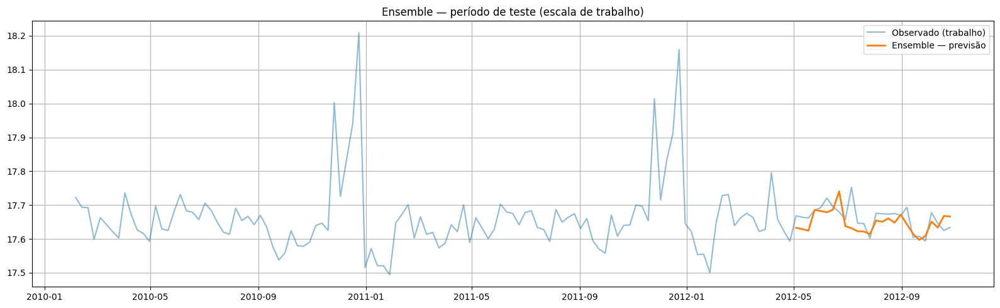

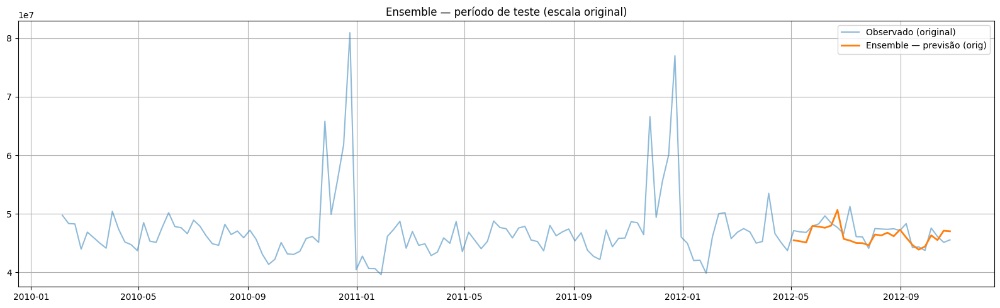

,modelo,RMSE,MAE,RMSSE
0,Ensemble (média simples),0.036371,0.027631,0.301827
1,LightGBM (lags/rolling),0.075933,0.062968,0.614003



==================== Naive ====================


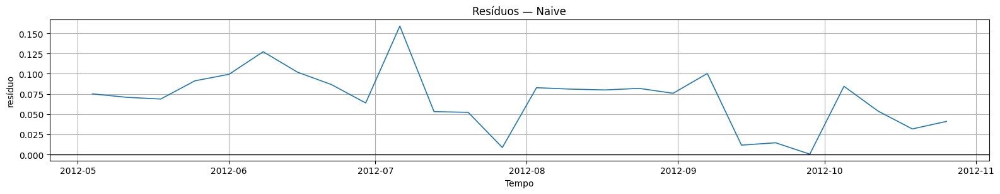

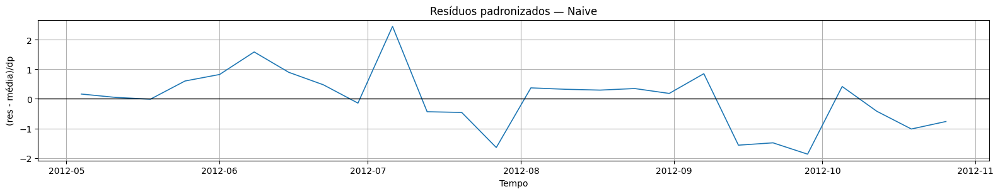

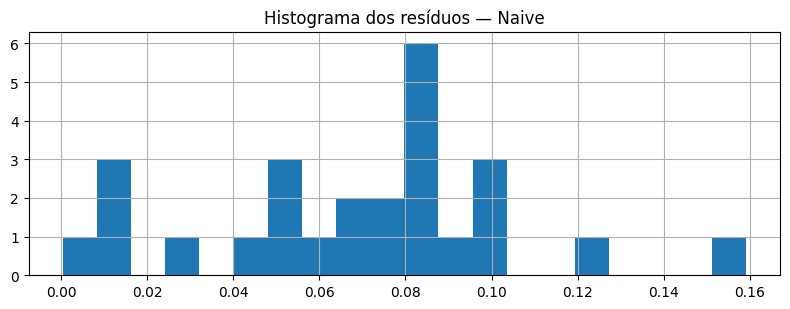

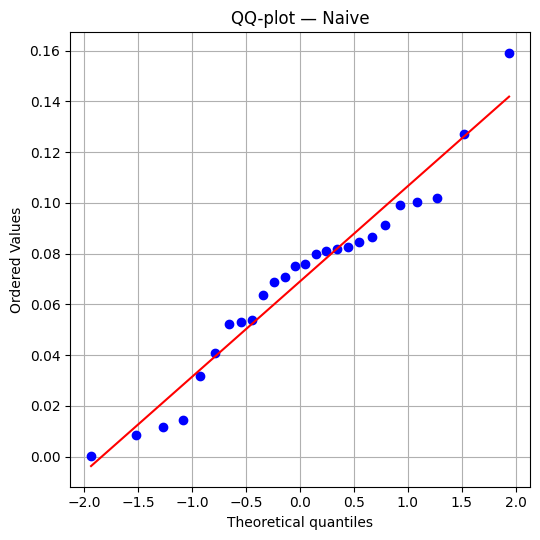

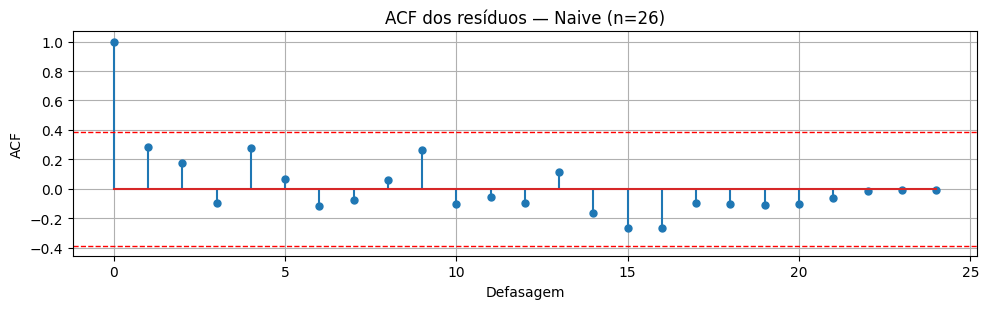


==================== Seasonal-Naive ====================


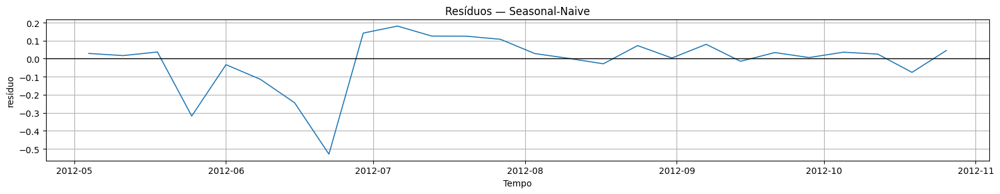

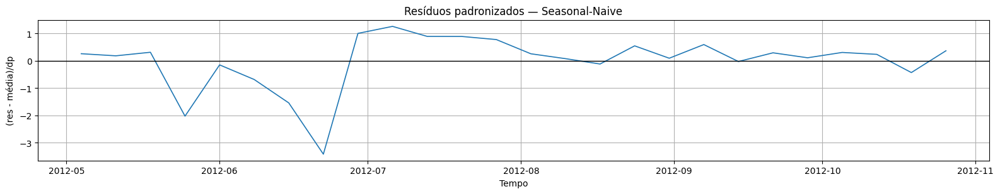

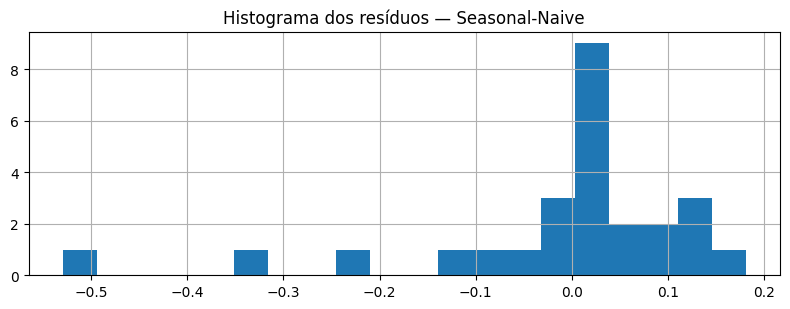

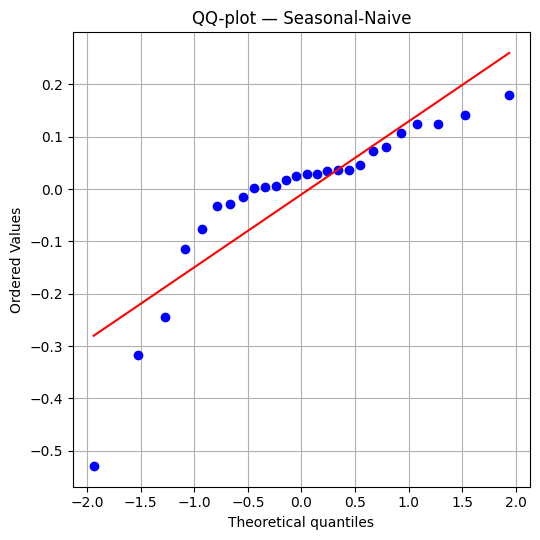

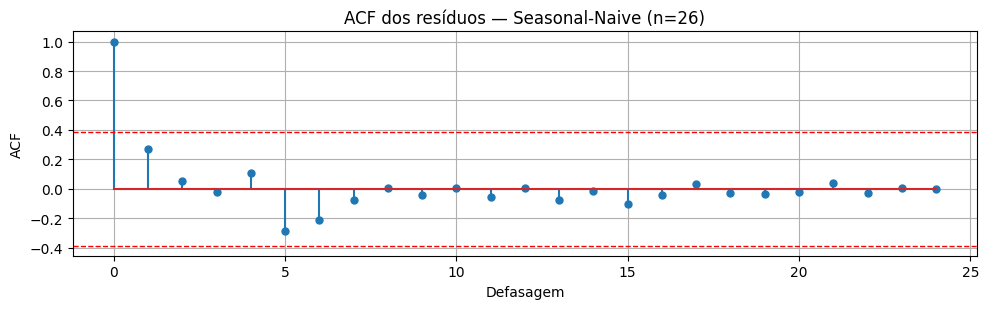


==================== Holt–Winters ====================


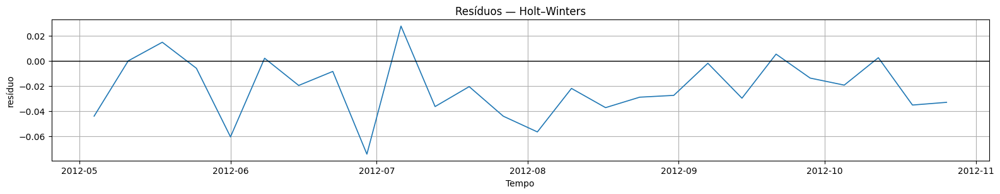

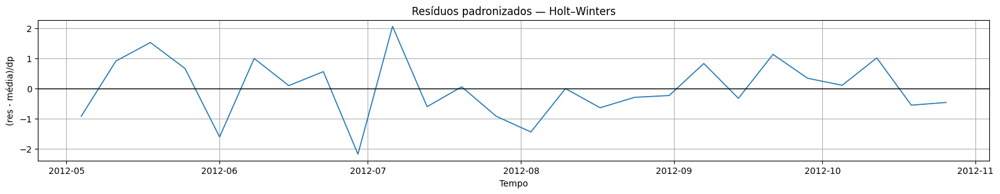

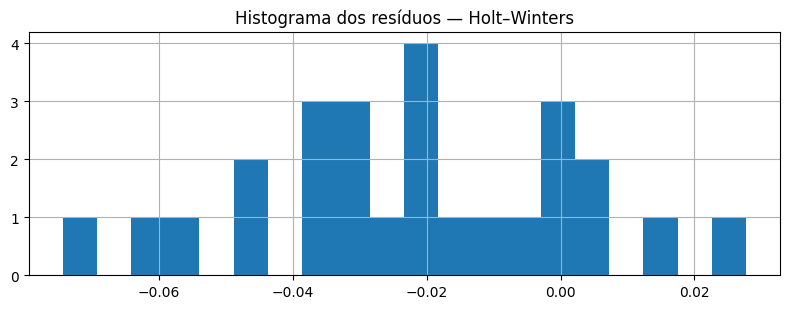

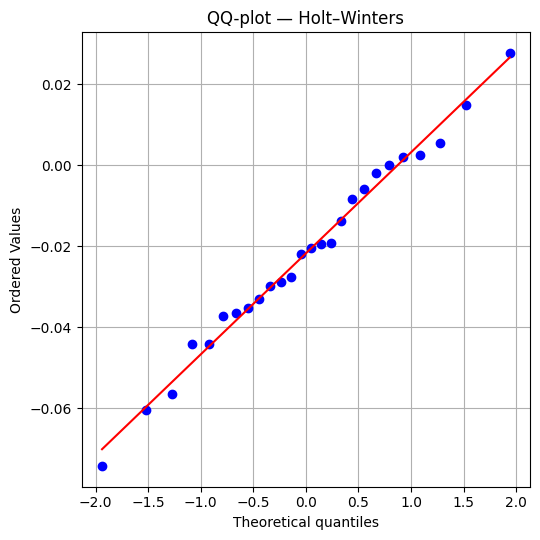

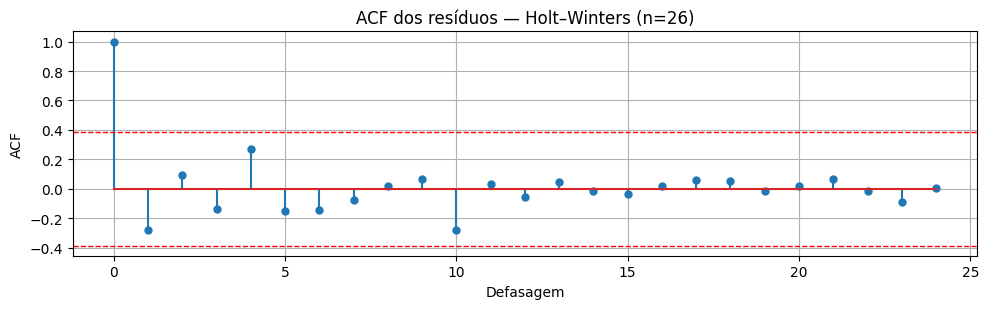


==================== Prophet ====================


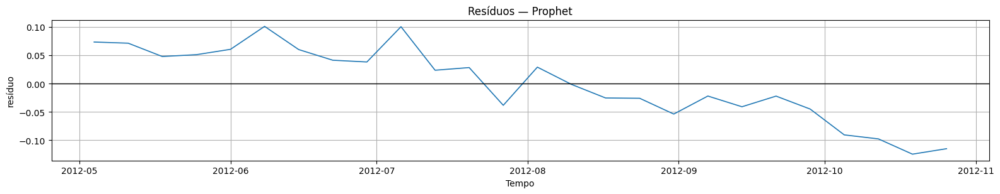

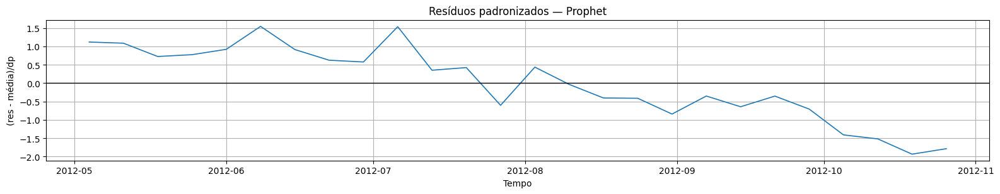

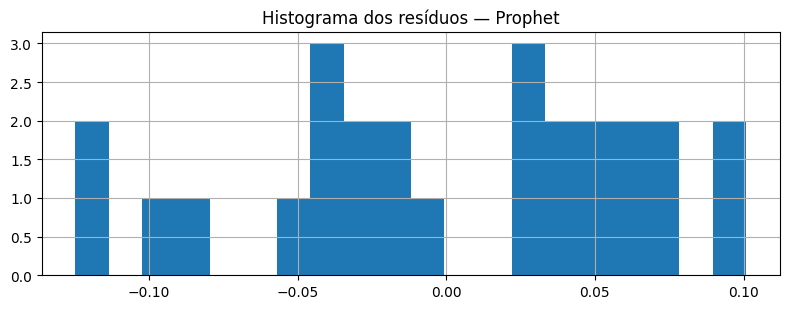

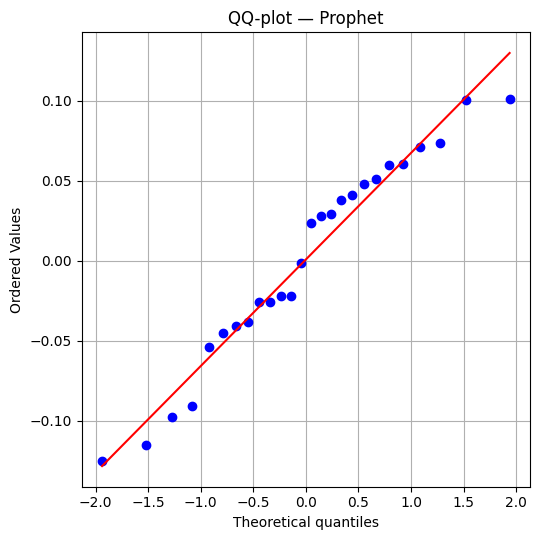

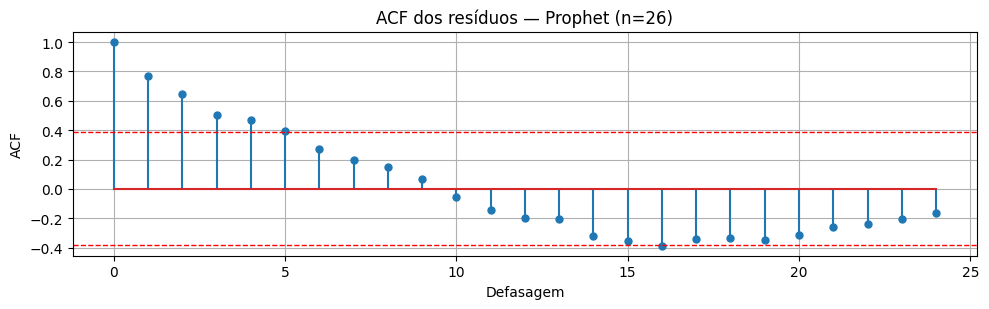


==================== XGBoost ====================


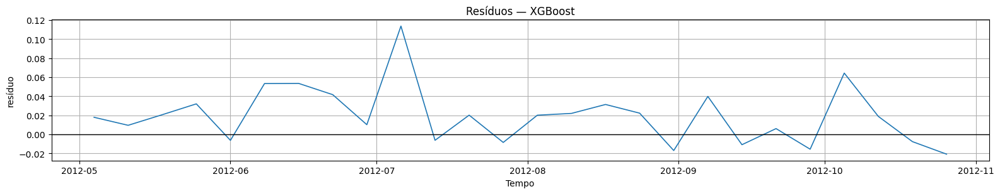

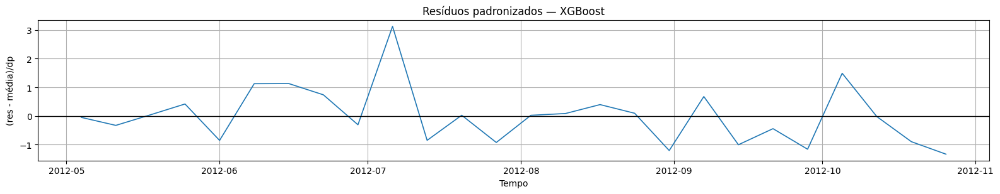

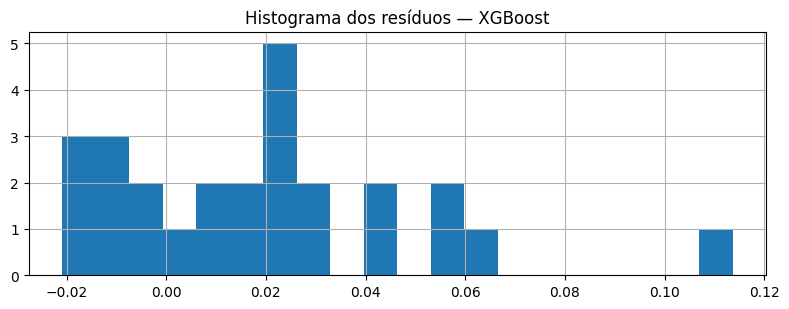

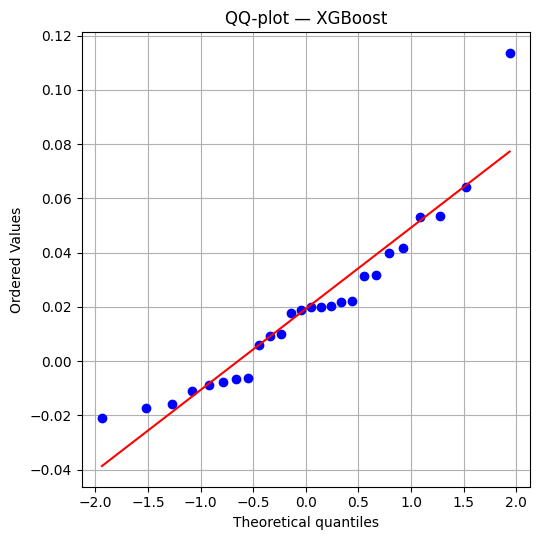

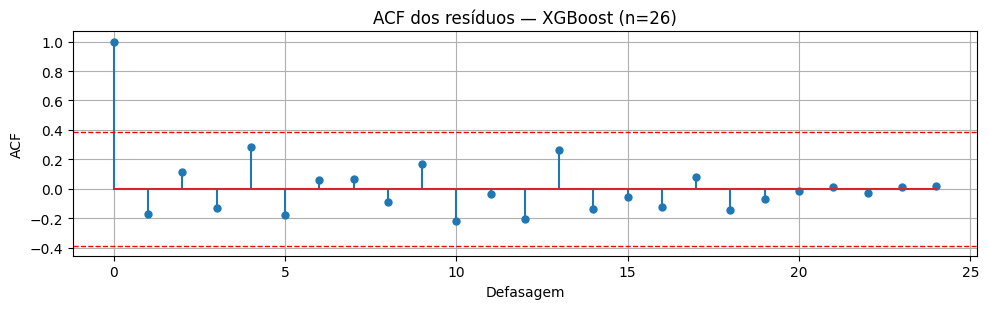


==================== CatBoost ====================


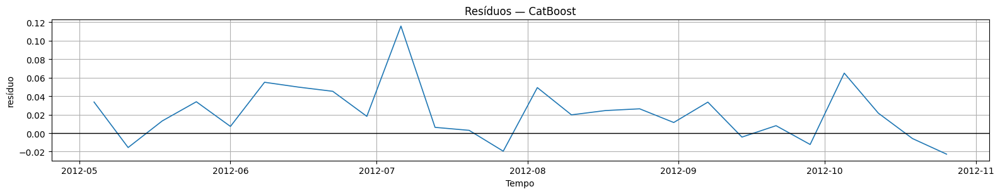

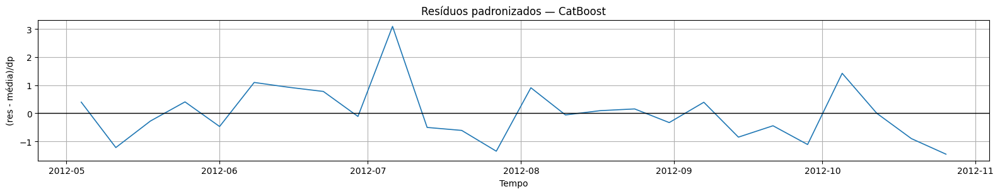

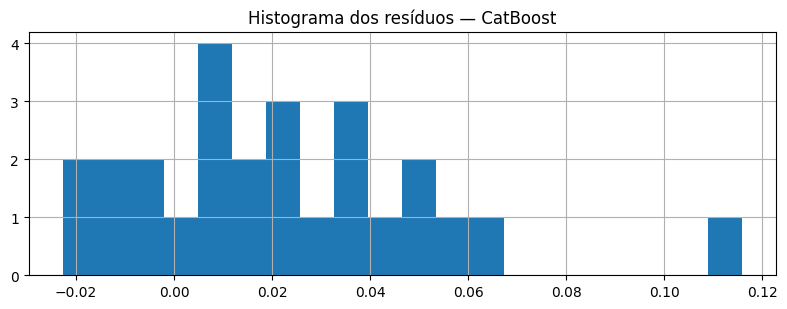

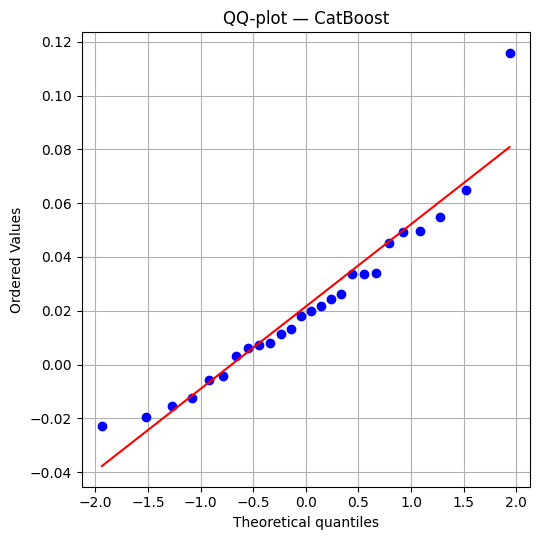

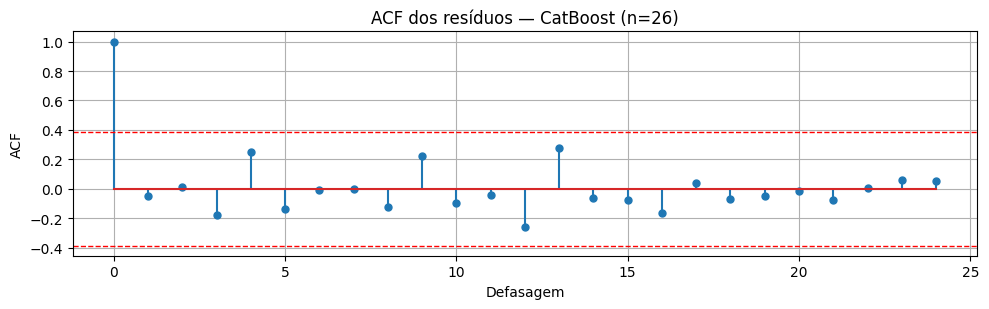


==================== LightGBM ====================


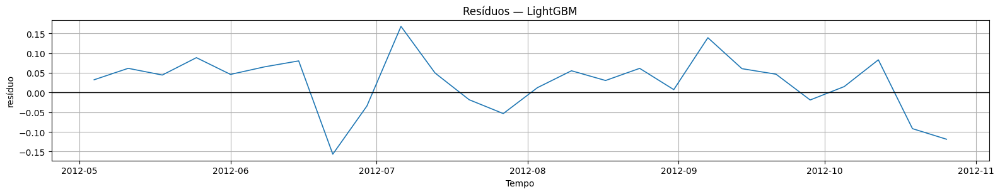

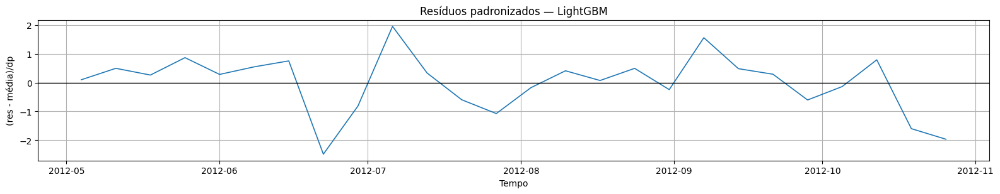

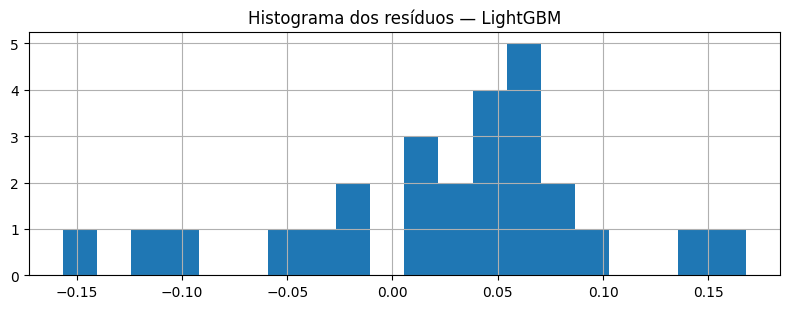

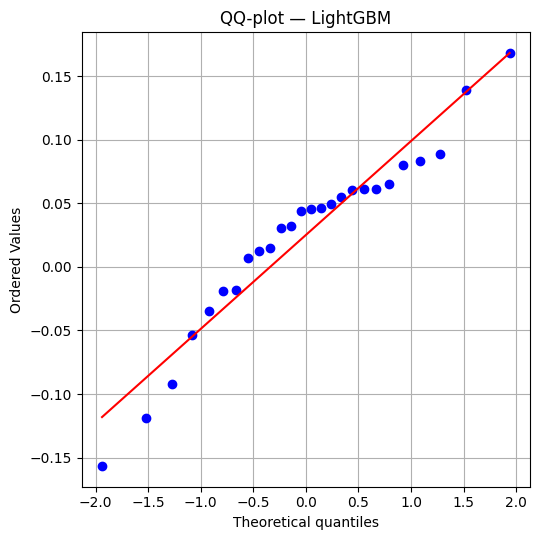

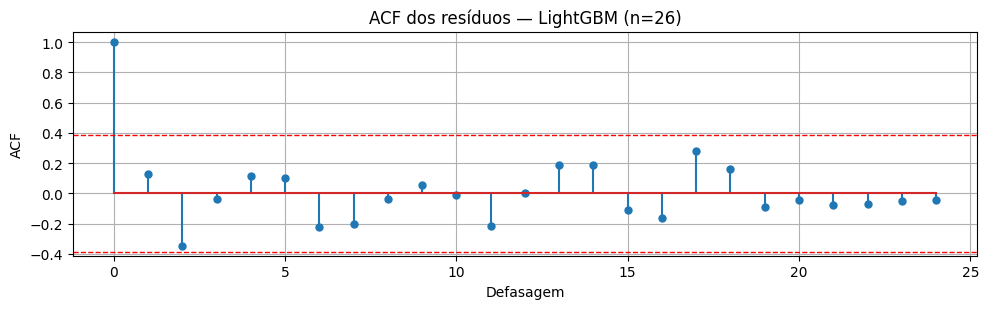


==================== LSTM ====================


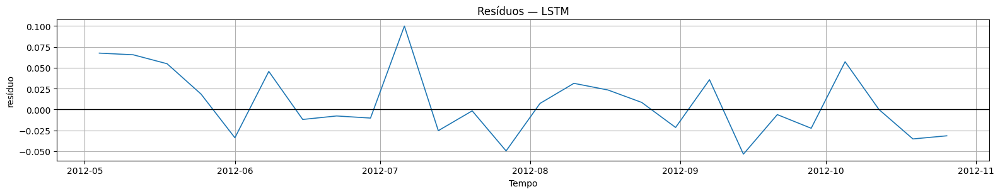

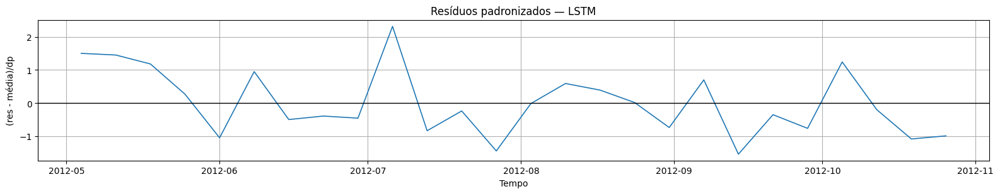

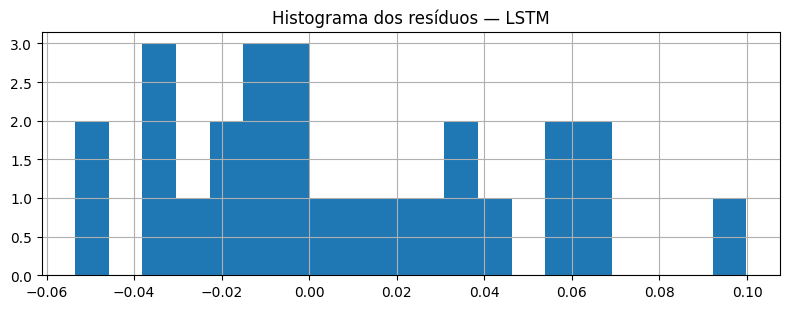

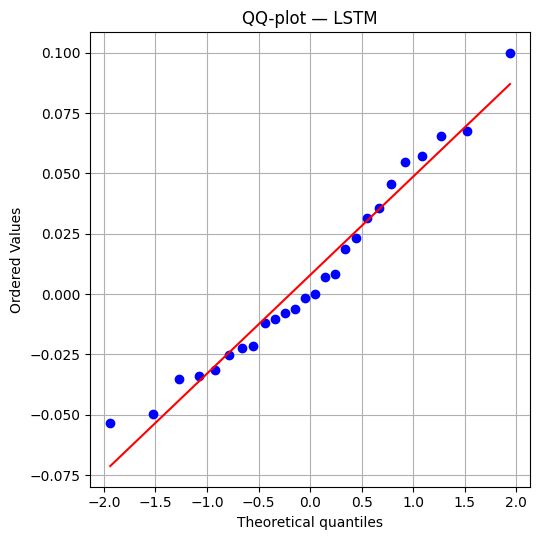

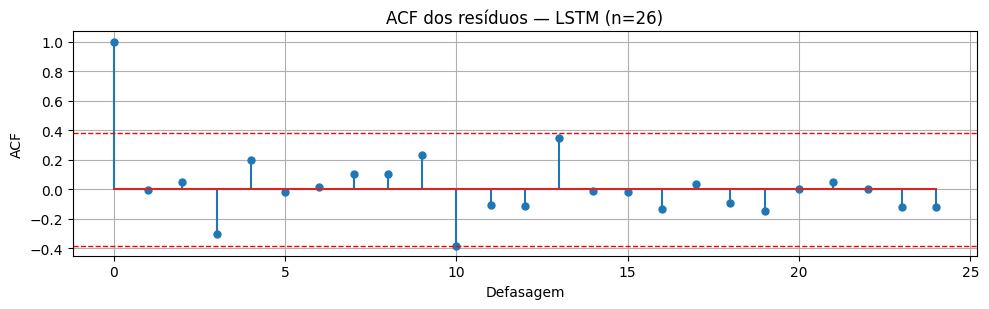


==================== Ensemble ====================


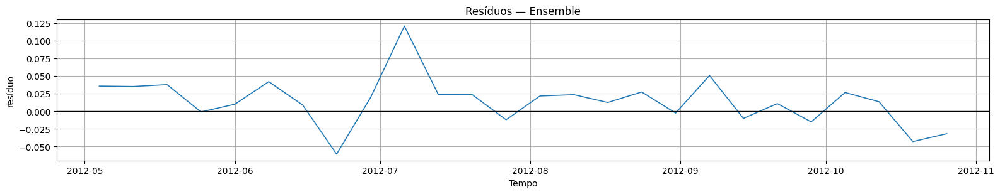

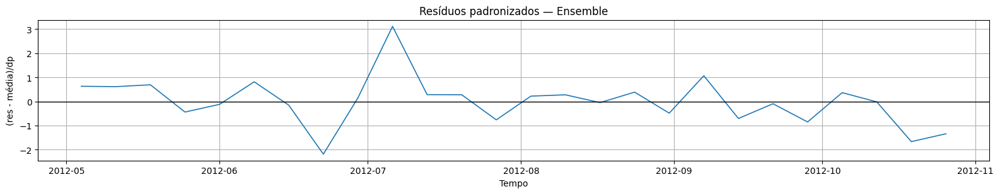

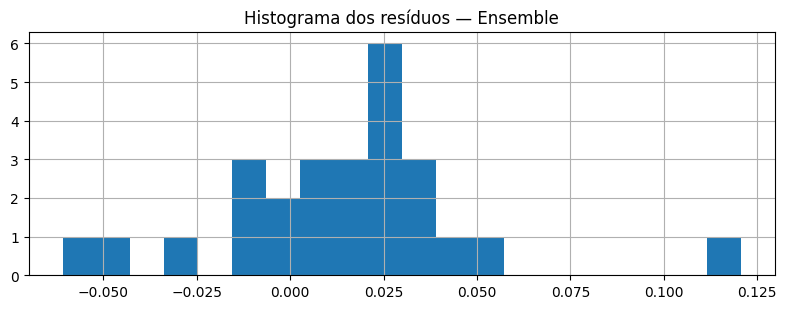

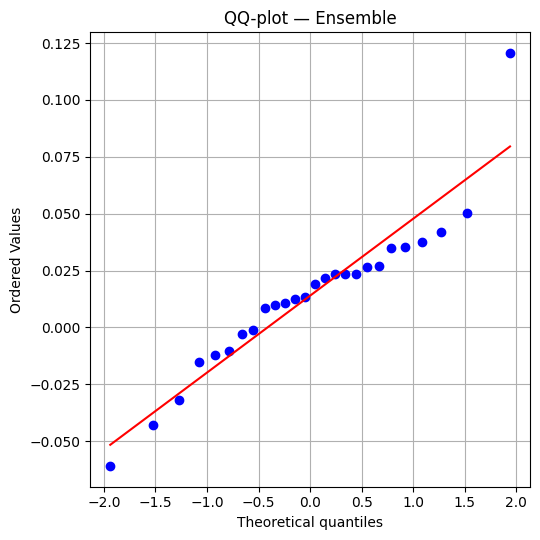

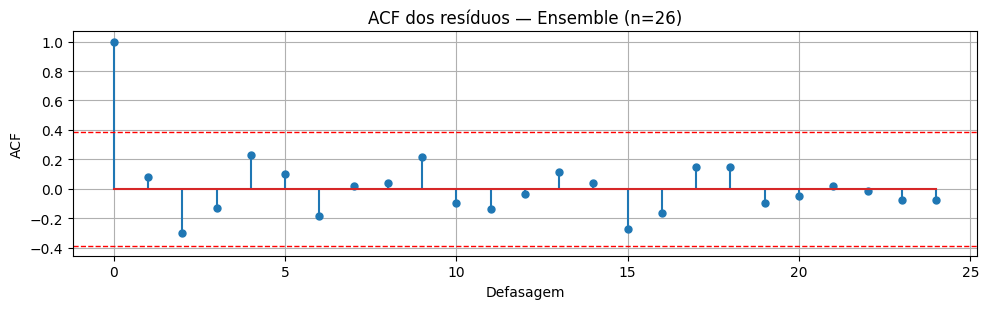

,n,media_res,dp_res,LB_p(12),LB_p(24),JB_p,Shapiro_p
modelo,,,,,,,
CatBoost,26,"0,0216","0,0305",0.562,0.625,0.023,0.093
Ensemble,26,"0,0140","0,0342",0.591,0.316,0.018,0.047
Holt–Winters,26,"-0,0218","0,0240",0.505,0.928,0.924,0.997
LSTM,26,"0,0079","0,0397",0.222,0.053,0.501,0.441
LightGBM,26,"0,0251","0,0731",0.558,0.173,0.358,0.180
Naive,26,"0,0691","0,0368",0.519,0.253,0.983,0.396
Prophet,26,"0,0008","0,0649",0.000,0.000,0.529,0.289
Seasonal-Naive,26,"-0,0101","0,1517",0.824,0.997,0.000,0.000
XGBoost,26,"0,0193","0,0302",0.465,0.620,0.011,0.027


In [ ]:
# ============================================================
# ETAPA: ANÁLISE DE RESÍDUOS DOS MODELOS
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
from statsmodels.stats.diagnostic import acorr_ljungbox
from scipy.stats import jarque_bera, shapiro, probplot

# ----------------------------
# 1) Funções utilitárias
# ----------------------------
def _conf_acf(n):
    """Limite de confiança 95% para ACF ≈ ±1.96/sqrt(n)"""
    return 1.96 / np.sqrt(max(n, 1))

def diagnostico_residuos(y_true: pd.Series, y_pred: pd.Series, nome: str,
                         lags_lb=(12, 24), nlags_acf=40, alpha=0.05,
                         plotar=True) -> dict:
    """
    Executa diagnóstico de resíduos:
    - série de resíduos e resíduos padronizados
    - histograma + QQ-plot
    - ACF com faixa de confiança
    - Ljung–Box (p lags), Jarque–Bera e Shapiro–Wilk
    Retorna dicionário com p-values e estatísticas.
    """
    # Alinha índices
    y_true = y_true.dropna()
    y_pred = y_pred.dropna()
    idx = y_true.index.intersection(y_pred.index)
    y_t = y_true.loc[idx]
    y_p = y_pred.loc[idx]

    # Resíduos
    res = (y_t - y_p)
    res = res.dropna()
    if res.empty:
        print(f"[{nome}] Sem resíduos (séries não se interceptam).")
        return {"modelo": nome}

    # Padronização por DP dos resíduos (para QQ/escala comparável)
    res_std = (res - res.mean()) / (res.std() if res.std() > 0 else 1.0)

    # ---- Testes estatísticos
    out = {"modelo": nome, "n": int(res.shape[0]),
           "media_res": float(res.mean()), "dp_res": float(res.std())}

    # Ljung–Box para alguns lags típicos
    try:
        lb = acorr_ljungbox(res, lags=list(lags_lb), return_df=True)
        for L in lags_lb:
            out[f"LB_p({L})"] = float(lb.loc[L, "lb_pvalue"]) if L in lb.index else np.nan
    except Exception:
        for L in lags_lb:
            out[f"LB_p({L})"] = np.nan

    # Normalidade
    try:
        jb_stat, jb_p = jarque_bera(res)
        out["JB_p"] = float(jb_p)
    except Exception:
        out["JB_p"] = np.nan

    try:
        if len(res) <= 5000:  # limite prático do Shapiro
            sh_stat, sh_p = shapiro(res)
            out["Shapiro_p"] = float(sh_p)
        else:
            out["Shapiro_p"] = np.nan
    except Exception:
        out["Shapiro_p"] = np.nan

    # ---- Gráficos (se solicitado)
    if plotar:
        # Série dos resíduos
        plt.figure(figsize=(16,3.2))
        plt.plot(res.index, res.values, lw=1.2)
        plt.axhline(0.0, color='k', lw=1)
        plt.title(f"Resíduos — {nome}")
        plt.xlabel("Tempo"); plt.ylabel("resíduo")
        plt.tight_layout(); plt.show()

        # Resíduos padronizados
        plt.figure(figsize=(16,3.2))
        plt.plot(res_std.index, res_std.values, lw=1.2)
        plt.axhline(0.0, color='k', lw=1)
        plt.title(f"Resíduos padronizados — {nome}")
        plt.xlabel("Tempo"); plt.ylabel("(res - média)/dp")
        plt.tight_layout(); plt.show()

        # Histograma (sem seaborn)
        plt.figure(figsize=(8,3.2))
        plt.hist(res.values, bins=20)
        plt.title(f"Histograma dos resíduos — {nome}")
        plt.tight_layout(); plt.show()

        # QQ-plot (contra Normal)
        plt.figure(figsize=(5.5,5.5))
        probplot(res.values, dist="norm", plot=plt)
        plt.title(f"QQ-plot — {nome}")
        plt.tight_layout(); plt.show()

        # ACF
        n = len(res)
        nl = min(nlags_acf, max(n-2, 1))
        acf_vals = acf(res, nlags=nl, fft=True)
        lags = np.arange(len(acf_vals))
        conf = _conf_acf(n)

        plt.figure(figsize=(10,3.2))
        markerline, stemlines, baseline = plt.stem(lags, acf_vals)
        plt.setp(markerline, markersize=5)
        plt.setp(stemlines, linewidth=1.5)
        plt.axhline(y= conf, color='red', linestyle='--', linewidth=1)
        plt.axhline(y=-conf, color='red', linestyle='--', linewidth=1)
        plt.title(f"ACF dos resíduos — {nome} (n={n})")
        plt.xlabel("Defasagem"); plt.ylabel("ACF")
        plt.tight_layout(); plt.show()

    return out

# -----------------------------------------
# 2) Lista de previsões para varrer automático
#    (só roda para as que existirem no ambiente)
# -----------------------------------------
candidatos = {
    "Naive":               globals().get("naive_fc"),
    "Seasonal-Naive":      globals().get("sn_fc"),
    "Holt–Winters":        globals().get("hw_fc"),
    "SARIMAX":             globals().get("sarimax_fc"),
    "Auto-ARIMA/SARIMA":   globals().get("auto_fc"),
    "Prophet":             globals().get("yhat_prophet"),
    "XGBoost":             globals().get("yhat_xgb"),
    "CatBoost":            globals().get("yhat_cat"),
    "LightGBM":            globals().get("yhat_lgbm"),
    "LSTM":                globals().get("yhat_lstm"),
    "Híbrido (HW+RF)":     globals().get("hibrido_fc"),
    "Ensemble":            globals().get("ensemble_fc"),
}

# alvo: use o mesmo y_test (escala de trabalho)
assert 'y_test' in globals(), "y_test não encontrado."

resumos = []
for nome, serie_pred in candidatos.items():
    if isinstance(serie_pred, pd.Series) and not serie_pred.dropna().empty:
        print(f"\n==================== {nome} ====================")
        diag = diagnostico_residuos(y_test, serie_pred, nome, lags_lb=(12,24), nlags_acf=40, alpha=0.05, plotar=True)
        resumos.append(diag)

# -----------------------------------------
# 3) Tabela-resumo com p-values e estatísticas
# -----------------------------------------
if resumos:
    df_diag = pd.DataFrame(resumos)
    # Formatação amigável
    cols_fmt = ["media_res", "dp_res", "LB_p(12)", "LB_p(24)", "JB_p", "Shapiro_p"]
    def _fmt_p(v):
        return "-" if pd.isna(v) else f"{v:.3f}"
    def _fmt_x(v):
        return "-" if pd.isna(v) else f"{v:,.4f}".replace(",", "X").replace(".", ",").replace("X", ".")
    vis = df_diag.copy()
    for c in ["media_res","dp_res"]:
        if c in vis.columns:
            vis[c] = vis[c].apply(_fmt_x)
    for c in ["LB_p(12)","LB_p(24)","JB_p","Shapiro_p"]:
        if c in vis.columns:
            vis[c] = vis[c].apply(_fmt_p)
    display(vis.set_index("modelo").sort_index())
else:
    print("Nenhuma previsão válida encontrada para análise de resíduos.")
